In [2]:

import scipy.stats as stats

import seaborn as sns
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import geopandas
import contextily as ctx
import descartes
from shapely.geometry import Point, Polygon
from geopandas import GeoDataFrame, GeoSeries

In [ ]:
-- total tracts
-- nonempty tract   have values from 2009 2018
-- qualified tract after 1 test 612
-- qualied tract after 2 test  (gentrified)  90
-- visualize 2195

In [138]:
len(final_df)

38670

In [16]:
'''
An increase in a tract's educational attainment, as measured by the percentage of residents age 25 and over holding bachelor’s degrees, was in the top third percentile of all tracts within a metro area.
A tract’s median home value increased when adjusted for inflation.
The percentage increase in a tract’s inflation-adjusted median home value was in the top third percentile of all tracts within a metro area.
'''
tract_converter = pd.read_csv('census_block_loc.csv')
tract_converter.BlockCode = tract_converter.BlockCode.apply(lambda x: int(str(x)[:-4]))
tract_converter = tract_converter.groupby('BlockCode').mean()
indexes = tract_converter.index
all_locations = list(zip(tract_converter.Latitude,tract_converter.Longitude))
tract_converter = {i:indexes[n] for n,i in enumerate(all_locations)}
tract_converter_flip = {indexes[n]:i for n,i in enumerate(all_locations)}
tract_converter

final_df = pd.read_csv('mycensus_all.csv')
qualified_first_step = []
income = final_df.loc[final_df.year==2009,'MedianIncome'].quantile(0.4)
homevalue = final_df.loc[final_df.year==2009,'MedianHomeValue'].quantile(0.4)
interested_geoid = final_df.geoid.unique()

for one_tract in interested_geoid:
    this_df = final_df.loc[final_df.geoid==one_tract,:]
    if this_df.loc[this_df.year==2009,'Population'].values[0] >=500 and this_df.loc[this_df.year==2018,'Population'].values[0] >=500:
        if this_df.loc[this_df.year==2009,'MedianIncome'].values[0] <= income and this_df.loc[this_df.year==2009,'MedianHomeValue'].values[0] <=homevalue:
            if one_tract in indexes:
                qualified_first_step.append(one_tract)
print('No. of qualified tract for less ')
print(len(qualified_first_step))


threshold = 2/3 # defination for gentrified
begin_year_df = final_df.loc[final_df.year==2009,:]
home_percent_dict = {}
for year in range(2010,2019):
    AllPercChange = []
    this_year_df = final_df.loc[final_df.year==year,:]
    for one_tract in interested_geoid:
        begin = begin_year_df.loc[begin_year_df.geoid==one_tract,'MedianHomeValue'].values[0]
        end = this_year_df.loc[this_year_df.geoid==one_tract,'MedianHomeValue'].values[0]
        AllPercChange.append((end-begin)/begin)
    home_percent_dict[year] = np.quantile(AllPercChange,threshold)

EduPerc = final_df.loc[final_df.year==2009,'BachelarPerc'].quantile(threshold)
dict_qualified_first_step = {i:[0 for i in range(2010,2019)] for i in qualified_first_step}
dict_qualified_second_step = {}
inflation = 0.0

for n,year in enumerate(range(2010,2019)):
    this_year_df = final_df.loc[final_df.year==year,:]
    for one_tract in qualified_first_step:
        if this_year_df.loc[this_year_df.geoid==one_tract,'BachelarPerc'].values[0]>=EduPerc:
            begin = begin_year_df.loc[begin_year_df.geoid==one_tract,'MedianHomeValue'].values[0]
            end = this_year_df.loc[this_year_df.geoid==one_tract,'MedianHomeValue'].values[0]
            change = (end-begin)/begin
            if change**(1/(n+1))>=inflation and change>=home_percent_dict[year]:
                if one_tract in dict_qualified_second_step:
                    value = dict_qualified_second_step[one_tract]
                    value[n] = 1
                    dict_qualified_second_step[one_tract] = value
                else:
                    value = dict_qualified_first_step[one_tract]
                    value[n] = 1
                    dict_qualified_second_step[one_tract] = value
print(len(dict_qualified_second_step))
dict_qualified_second_step

No. of qualified tract for less 
612


C:\Users\richard\Anaconda3\lib\site-packages\ipykernel_launcher.py:55: RuntimeWarning: invalid value encountered in double_scalars


90


{34003029100: [1, 0, 0, 0, 0, 0, 0, 0, 0],
 34017001000: [1, 1, 0, 1, 1, 1, 1, 1, 1],
 34017010100: [1, 0, 0, 0, 0, 0, 0, 0, 0],
 34017017300: [1, 1, 0, 0, 0, 0, 0, 0, 0],
 34017018000: [1, 1, 1, 1, 1, 1, 1, 1, 0],
 34031124323: [1, 0, 0, 0, 0, 0, 0, 0, 0],
 36005039200: [1, 0, 0, 0, 0, 0, 0, 0, 0],
 36047035400: [1, 0, 0, 0, 0, 0, 0, 1, 1],
 36047036600: [1, 1, 0, 0, 0, 0, 0, 0, 1],
 36047019500: [1, 1, 1, 1, 1, 1, 1, 1, 1],
 36047052600: [1, 1, 1, 1, 1, 1, 1, 1, 1],
 36047053200: [1, 1, 1, 1, 1, 1, 0, 1, 0],
 36047057000: [1, 0, 0, 0, 1, 0, 0, 0, 0],
 36047060600: [1, 1, 1, 1, 1, 0, 0, 0, 0],
 36047062600: [1, 1, 1, 1, 1, 0, 0, 0, 0],
 36061019800: [1, 1, 1, 1, 1, 0, 1, 0, 1],
 36061030300: [1, 0, 1, 0, 0, 0, 0, 0, 0],
 36061009700: [1, 1, 1, 1, 1, 1, 1, 1, 1],
 36081086500: [1, 1, 1, 1, 1, 0, 0, 0, 0],
 36081088901: [1, 1, 0, 1, 0, 0, 0, 0, 0],
 36081013400: [1, 1, 0, 0, 1, 1, 1, 1, 0],
 36081025500: [1, 1, 1, 1, 1, 1, 1, 1, 1],
 36081028300: [1, 1, 1, 0, 0, 1, 1, 0, 1],
 3608102870

In [218]:
df_toplot

,boro_code,boro_ct201,boro_name,cdeligibil,ct2010,ctlabel,ntacode,ntaname,puma,shape_area,...,No_NHOth,No_NHMul,No_His,MedianIncome,MedianHomeValue,NAME,county,state,tract,BachelarPerc
geoid,,,,,,,,,,,,,,,,,,,,,
36047052800,3,3073800,Brooklyn,E,073800,738,BK58,Flatlands,4009,1.944417e+06,...,0.0,0.0,136.0,80481.0,816900.0,"Census Tract 528, Kings County, New York",47,36,52800,0.150026
36081049600,4,4097202,Queens,E,097202,972.02,QN12,Hammels-Arverne-Edgemere,4114,6.197522e+06,...,198.0,128.0,693.0,56196.0,428100.0,"Census Tract 496, Queens County, New York",81,36,49600,0.081601
36047061002,3,3069800,Brooklyn,I,069800,698,BK45,Georgetown-Marine Park-Bergen Beach-Mill Basin,4009,5.424250e+06,...,0.0,79.0,74.0,43972.0,521800.0,"Census Tract 610.02, Kings County, New York",47,36,61002,0.378459
36047069200,3,3099400,Brooklyn,E,099400,994,BK50,Canarsie,4009,1.872517e+06,...,0.0,23.0,178.0,63298.0,473900.0,"Census Tract 692, Kings County, New York",47,36,69200,0.066929
36081066000,4,4097202,Queens,E,097202,972.02,QN12,Hammels-Arverne-Edgemere,4114,6.197522e+06,...,32.0,28.0,432.0,77500.0,483100.0,"Census Tract 660, Queens County, New York",81,36,66000,0.146655
34031124500,1,1022800,Manhattan,E,022800,228,MN03,Central Harlem North-Polo Grounds,3803,1.944083e+06,...,49.0,349.0,3130.0,52159.0,343100.0,"Census Tract 1245, Passaic County, New Jersey",31,34,124500,0.123380
36061003800,4,4025100,Queens,E,025100,251,QN63,Woodside,4109,2.552974e+06,...,37.0,160.0,896.0,53405.0,660200.0,"Census Tract 38, New York County, New York",61,36,3800,0.354503
34013003800,5,5012100,Staten Island,I,012100,121,SI35,New Brighton-Silver Lake,3903,7.991818e+06,...,0.0,60.0,12.0,36307.0,187500.0,"Census Tract 38, Essex County, New Jersey",13,34,3800,0.010622
36047077400,3,3096600,Brooklyn,I,096600,966,BK50,Canarsie,4009,1.950814e+06,...,0.0,0.0,572.0,40993.0,496200.0,"Census Tract 774, Kings County, New York",47,36,77400,0.113125


0.16073455705546927


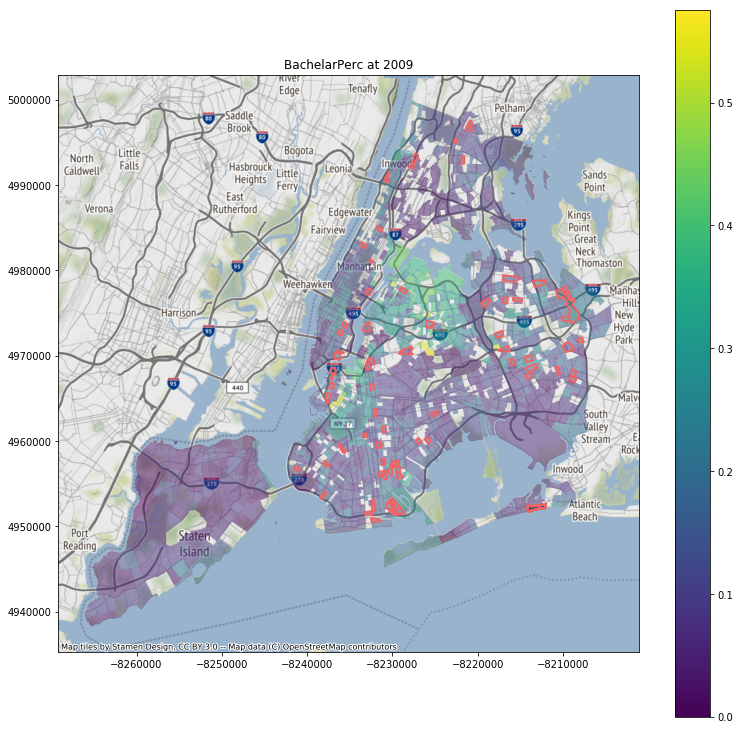

In [217]:
geo_df =  GeoDataFrame.from_file('./geoid_shape/geoid_toshape.shp')
df = pd.read_csv('mycensus_all.csv',index_col=0)


df = df.loc[df.year==2009,:]
interested_geoid = list(set(geo_df.geoid) & set(df.geoid))

geo_df = geo_df.set_index('geoid').loc[interested_geoid,:].merge(df.set_index('geoid').loc[interested_geoid,:],on='geoid')
df_toplot = geo_df.to_crs(epsg=3857)


gentrified_tract = [i for i in dict_qualified_second_step.keys() if i in geo_df.index]
gentrified_tract = geo_df.loc[gentrified_tract].to_crs(epsg=3857)

print(gentrified_tract.BachelarPerc.mean())
f, ax = plt.subplots(1, figsize=(13,13))
df_toplot.plot(ax=ax,column='BachelarPerc', cmap='viridis', alpha=0.5,legend=True)
gentrified_tract.plot(ax=ax,alpha=1, edgecolor='#ef6565', linewidth=2,facecolor="none")
ctx.add_basemap(ax)
plt.title('BachelarPerc at 2009')
plt.show()

0.19043124212113444


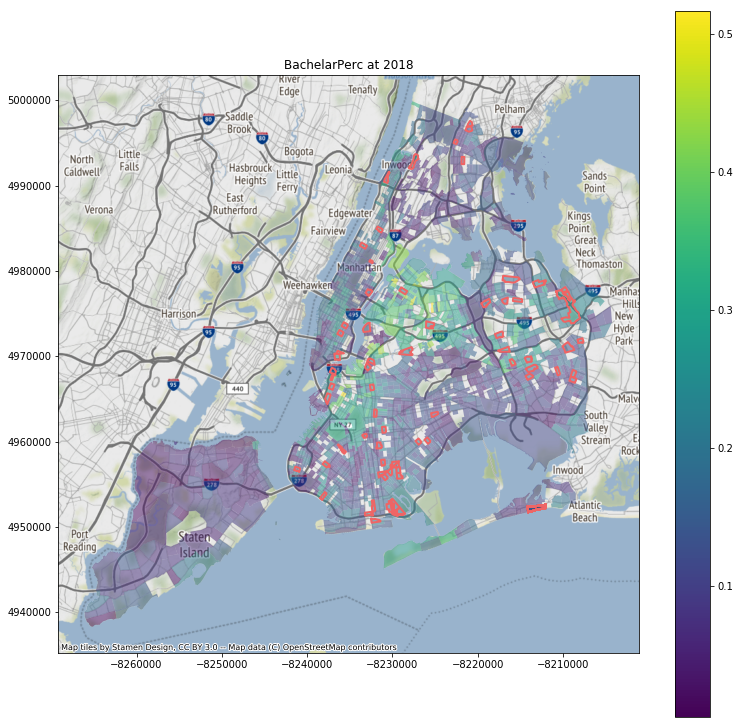

In [139]:
geo_df =  GeoDataFrame.from_file('./geoid_shape/geoid_toshape.shp')
df = pd.read_csv('mycensus_all.csv',index_col=0)
df = df.loc[df.year==2018,:]
interested_geoid = list(set(geo_df.geoid) & set(df.geoid))

geo_df = geo_df.set_index('geoid').loc[interested_geoid,:].merge(df.set_index('geoid').loc[interested_geoid,:],on='geoid')
df_toplot = geo_df.to_crs(epsg=3857)

gentrified_tract = [i for i in dict_qualified_second_step.keys() if i in geo_df.index]
gentrified_tract = geo_df.loc[gentrified_tract].to_crs(epsg=3857)
print(gentrified_tract.BachelarPerc.mean())
f, ax = plt.subplots(1, figsize=(13,13))
ax = df_toplot.plot(ax=ax,column='BachelarPerc', cmap='viridis', alpha=0.5,legend=True)
ax = gentrified_tract.plot(ax=ax,alpha=1, edgecolor='#ef6565', linewidth=2,facecolor="none")
ctx.add_basemap(ax)
plt.title('BachelarPerc at 2018')
plt.show()

In [147]:
df = pd.read_csv('mycensus_all.csv',index_col=0)
df1 = df.loc[df.year==2009,:].set_index('geoid').drop(['year','NAME','county','state','tract'], axis=1)
df2 = df.loc[df.year==2018,:].set_index('geoid').drop(['year','NAME','county','state','tract'], axis=1)
df1.iloc[:,1:9] = df1.iloc[:,1:9].div(df1.iloc[:,0].values, axis='rows')
df2.iloc[:,1:9] = df2.iloc[:,1:9].div(df2.iloc[:,0].values, axis='rows')
change_df = (df2-df1)/(df1+0.0001)
change_df = change_df.clip(change_df.quantile(0.05), change_df.quantile(0.95),axis=1) 
change_df

,Population,No_NHInd,No_NHCau,No_NHBlk,No_NHAsn,No_NHHaw,No_NHOth,No_NHMul,No_His,MedianIncome,MedianHomeValue,BachelarPerc
geoid,,,,,,,,,,,,
34003001000,0.024545,0.000000,-0.010710,-0.057180,0.070427,0.0,-0.982475,1.308711,-0.195030,0.244370,-0.028571,0.198275
34003002100,-0.187420,-0.972114,-0.212870,2.629706,0.269588,0.0,19.828156,132.187707,0.099773,-0.150227,0.631089,-0.013590
34003002200,0.041570,24.020695,-0.094822,2.864347,0.069486,0.0,-0.934293,0.162566,0.554271,0.222641,-0.128990,0.960422
34003002300,-0.055050,87.643925,-0.060918,-0.673533,-0.024516,0.0,41.244200,-0.061602,3.263347,0.360380,-0.047260,0.071949
34003003100,0.051837,0.000000,0.051910,0.542835,-0.217352,0.0,27.163368,-0.767351,0.181733,-0.015002,-0.130844,0.069997
34003003200,0.283551,49.980008,-0.482702,-0.423600,0.561350,0.0,-0.933705,0.128427,0.669009,0.215592,-0.089456,-0.031754
34003003300,0.001340,0.000000,-0.307232,0.198034,0.003961,0.0,0.000000,0.341696,0.679707,0.104722,-0.089710,0.420945
34003003401,0.026888,0.000000,0.174315,-0.422319,-0.135124,0.0,0.000000,-0.848927,-0.028089,0.317705,-0.044784,0.109227
34003003402,0.095590,127.246595,-0.139467,0.620274,-0.255436,0.0,10.804970,5.389612,1.037651,0.483164,-0.084314,0.068205


In [158]:
geo_df =  GeoDataFrame.from_file('./geoid_shape/geoid_toshape.shp')
geo_df

,boro_code,boro_ct201,boro_name,cdeligibil,ct2010,ctlabel,ntacode,ntaname,puma,shape_area,shape_leng,geoid,geometry
0,1,1025500,Manhattan,I,025500,255,MN36,Washington Heights South,3801,4.756106e+06,10770.816479,34003004001,"POLYGON ((-73.94318 40.84980, -73.94319 40.849..."
1,1,1022302,Manhattan,I,022302,223.02,MN06,Manhattanville,3802,6.417359e+05,3985.500605,34003004002,"POLYGON ((-73.95556 40.81943, -73.95602 40.818..."
2,1,1015100,Manhattan,I,015100,151,MN14,Lincoln Square,3806,3.579761e+06,10114.763550,34003005000,"POLYGON ((-73.98441 40.77481, -73.98488 40.774..."
3,1,1020500,Manhattan,I,020500,205,MN09,Morningside Heights,3802,2.977096e+06,7148.864851,34003006100,"POLYGON ((-73.96111 40.81183, -73.96157 40.811..."
4,1,1019900,Manhattan,I,019900,199,MN09,Morningside Heights,3802,2.406577e+06,6655.708009,34003006201,"POLYGON ((-73.96485 40.80671, -73.96475 40.806..."
5,1,1021100,Manhattan,E,021100,211,MN09,Morningside Heights,3802,3.738243e+06,7629.112139,34003006202,"POLYGON ((-73.95626 40.81339, -73.95656 40.812..."
6,1,1019100,Manhattan,I,019100,191,MN12,Upper West Side,3806,2.385203e+06,6614.178613,34003006300,"POLYGON ((-73.96571 40.80044, -73.96621 40.799..."
7,1,1018700,Manhattan,I,018700,187,MN12,Upper West Side,3806,2.323892e+06,6534.411284,34003011200,"POLYGON ((-73.96758 40.79787, -73.96804 40.797..."
8,1,1016300,Manhattan,I,016300,163,MN12,Upper West Side,3806,2.861237e+06,9750.709853,34003011300,"POLYGON ((-73.98508 40.78592, -73.98504 40.785..."
9,1,1019500,Manhattan,I,019500,195,MN09,Morningside Heights,3802,2.338296e+06,6579.740598,34003011400,"POLYGON ((-73.96386 40.80297, -73.96430 40.802..."


0.2576508066124827


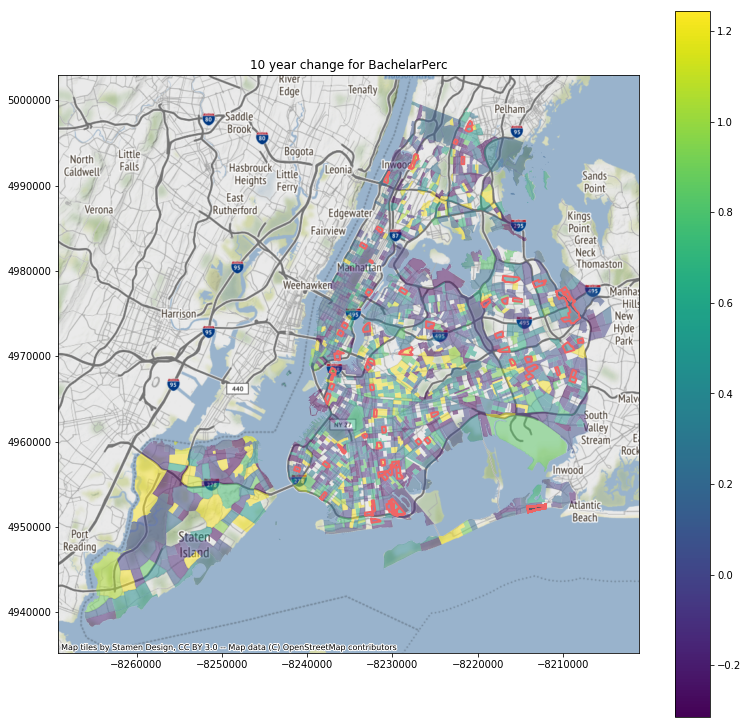

In [148]:
df = pd.read_csv('mycensus_all.csv',index_col=0)
df1 = df.loc[df.year==2009,:].set_index('geoid').drop(['year','NAME','county','state','tract'], axis=1)
df2 = df.loc[df.year==2018,:].set_index('geoid').drop(['year','NAME','county','state','tract'], axis=1)
df1.iloc[:,1:9] = df1.iloc[:,1:9].div(df1.iloc[:,0].values, axis='rows')
df2.iloc[:,1:9] = df2.iloc[:,1:9].div(df2.iloc[:,0].values, axis='rows')
change_df = (df2-df1)/(df1+0.0001)
change_df = change_df.clip(change_df.quantile(0.05), change_df.quantile(0.95),axis=1) 


geo_df =  GeoDataFrame.from_file('./geoid_shape/geoid_toshape.shp')
interested_geoid = list(set(geo_df.geoid) & set(change_df.index))

geo_df = geo_df.set_index('geoid').loc[interested_geoid,:].merge(change_df.loc[interested_geoid,:],on='geoid')
df_toplot = geo_df.to_crs(epsg=3857)

gentrified_tract = [i for i in dict_qualified_second_step.keys() if i in geo_df.index]
gentrified_tract = geo_df.loc[gentrified_tract].to_crs(epsg=3857)
print(gentrified_tract.BachelarPerc.mean())
f, ax = plt.subplots(1, figsize=(13,13))
ax = df_toplot.plot(ax=ax,column='BachelarPerc', cmap='viridis', alpha=0.5,legend=True)
ax = gentrified_tract.plot(ax=ax,alpha=1, edgecolor='#ef6565', linewidth=2,facecolor="none")
ctx.add_basemap(ax)
plt.title('10 year change for BachelarPerc')
plt.show()

0.34252146080165224


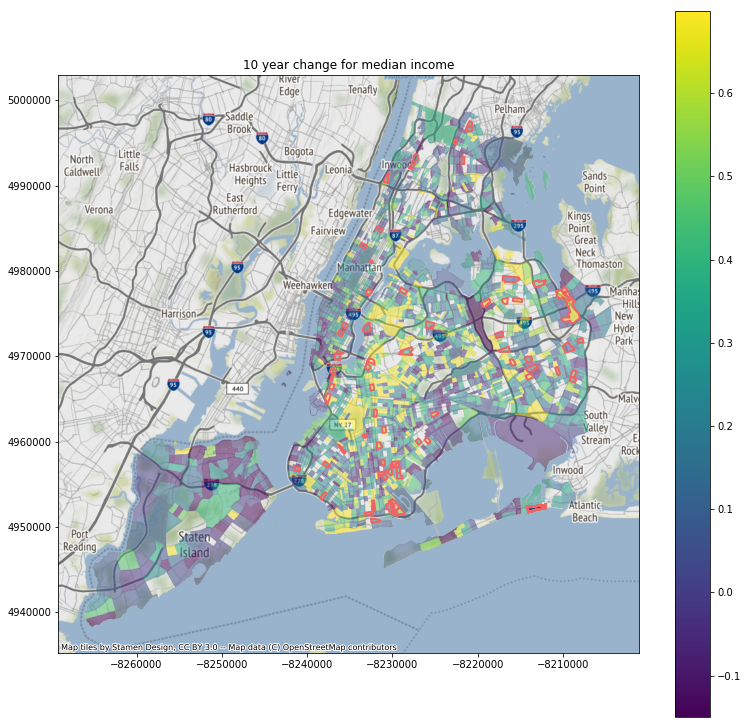

In [149]:
print(gentrified_tract.MedianIncome.mean())
f, ax = plt.subplots(1, figsize=(13,13))
ax = df_toplot.plot(ax=ax,column='MedianIncome', cmap='viridis', alpha=0.5,legend=True)
ax = gentrified_tract.plot(ax=ax,alpha=1, edgecolor='#ef6565', linewidth=2,facecolor="none")
ctx.add_basemap(ax)
plt.title('10 year change for median income')
plt.show()

96978.20224719102


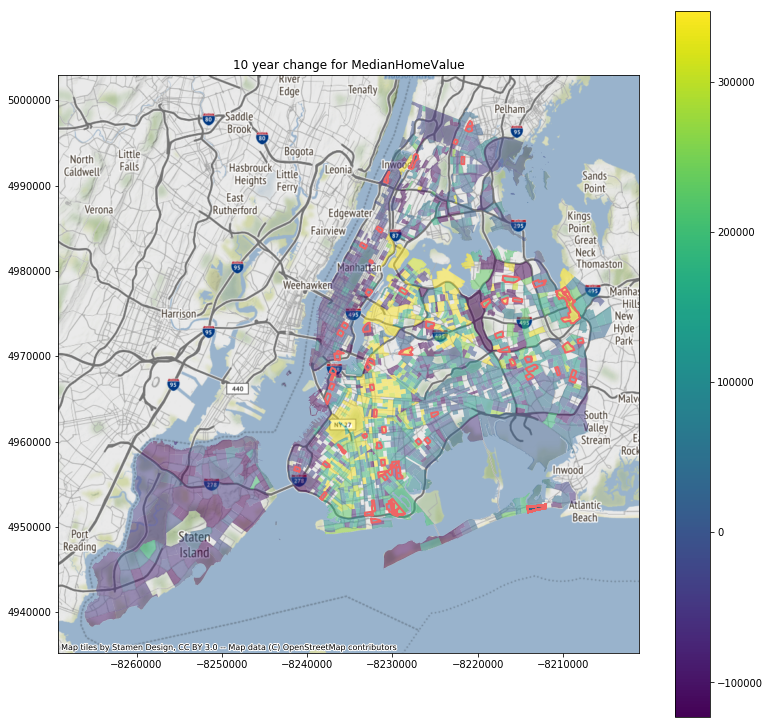

In [142]:
print(gentrified_tract.MedianHomeValue.mean())
f, ax = plt.subplots(1, figsize=(13,13))
ax = df_toplot.plot(ax=ax,column='MedianHomeValue', cmap='viridis', alpha=0.5,legend=True)
ax = gentrified_tract.plot(ax=ax,alpha=1, edgecolor='#ef6565', linewidth=2,facecolor="none")
ctx.add_basemap(ax)
plt.title('10 year change for MedianHomeValue')
plt.show()

In [219]:
df_toplot.columns

Index(['boro_code', 'boro_ct201', 'boro_name', 'cdeligibil', 'ct2010',
       'ctlabel', 'ntacode', 'ntaname', 'puma', 'shape_area', 'shape_leng',
       'geometry', 'year', 'Population', 'No_NHInd', 'No_NHCau', 'No_NHBlk',
       'No_NHAsn', 'No_NHHaw', 'No_NHOth', 'No_NHMul', 'No_His',
       'MedianIncome', 'MedianHomeValue', 'NAME', 'county', 'state', 'tract',
       'BachelarPerc'],
      dtype='object')

0.004697921266263597


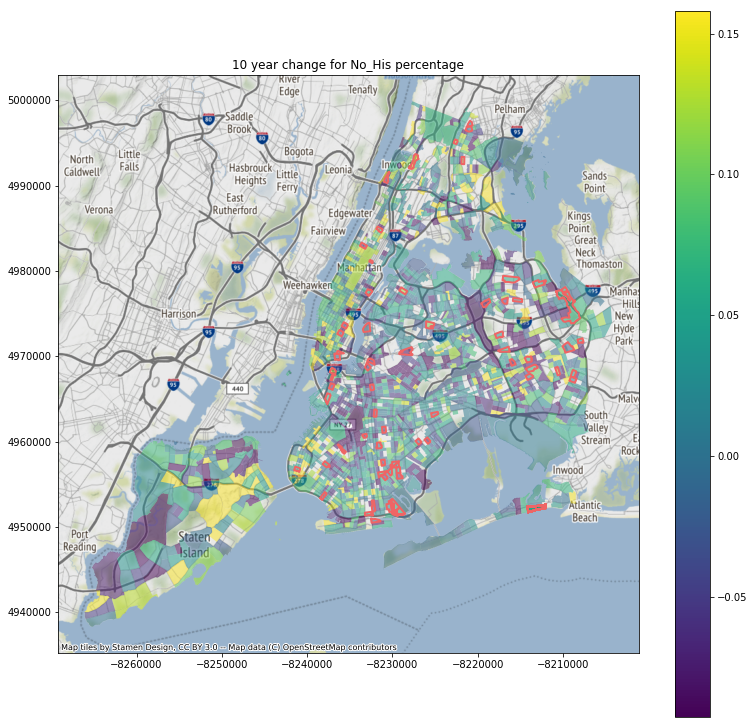

In [143]:
print(gentrified_tract.No_His.mean())
f, ax = plt.subplots(1, figsize=(13,13))
ax = df_toplot.plot(ax=ax,column='No_His', cmap='viridis', alpha=0.5,legend=True)
ax = gentrified_tract.plot(ax=ax,alpha=1, edgecolor='#ef6565', linewidth=2,facecolor="none")
ctx.add_basemap(ax)
plt.title('10 year change for No_His percentage')
plt.show()

122.38089887640447


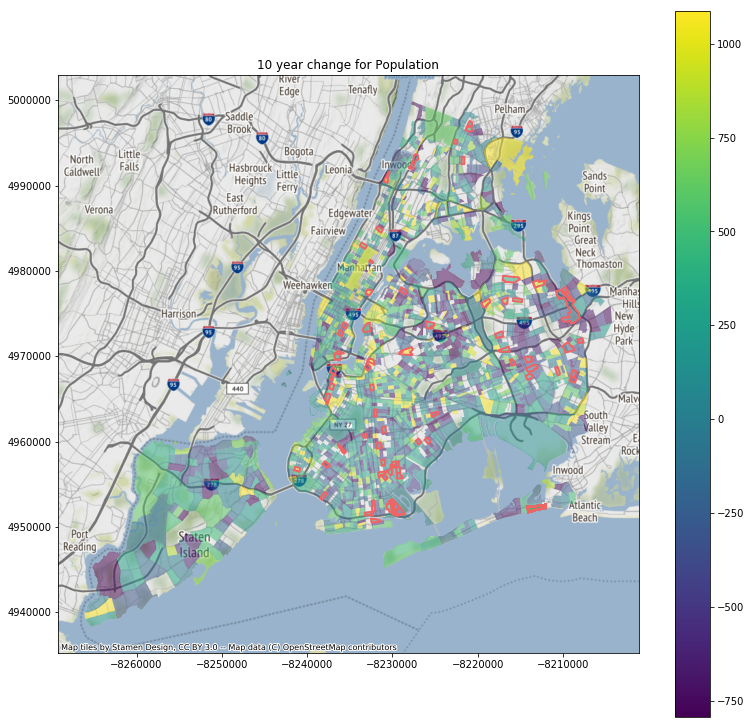

In [144]:
print(gentrified_tract.Population.mean())
f, ax = plt.subplots(1, figsize=(13,13))
ax = df_toplot.plot(ax=ax,column='Population', cmap='viridis', alpha=0.5,legend=True)
ax = gentrified_tract.plot(ax=ax,alpha=1, edgecolor='#ef6565', linewidth=2,facecolor="none")
ctx.add_basemap(ax)
plt.title('10 year change for Population')
plt.show()

----
----

**work on 311 call data**

In [3]:
def PlotAndCompare(line1,line2,title):
    fig, ax1 = plt.subplots()

    color = 'tab:red'
    ax1.set_xlabel('time (s)')
    ax1.set_ylabel('exp', color=color)
    ax1.plot(pd.to_datetime(line1.index), line1, color=color,label='NonGentri')
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.set_ylabel('sin', color=color)  # we already handled the x-label with ax1
    ax2.plot(pd.to_datetime(line2.index), line2, color=color,label='Gentri')
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    fig.legend()
    plt.title(title)
    plt.show()
    return None

all_311_call = pd.read_hdf('311CallALL.h5',key='data')
all_311_call = all_311_call[all_311_call.Month!='NaT']

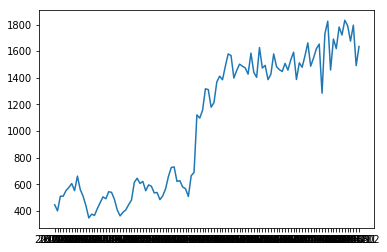

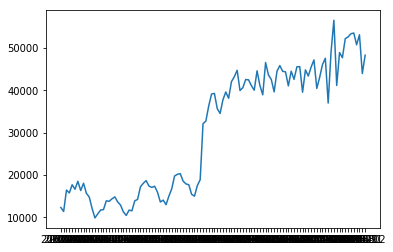

In [210]:
gentrified_tract_id = list(dict_qualified_second_step.keys())
Gentr_311_call = []
for i in range(len(gentrified_tract_id)):
    one_tract = gentrified_tract_id[i]
    Gentr_311_call.append(all_311_call[all_311_call.TractID == one_tract])
Gentr_311_call = pd.concat(Gentr_311_call)
plt.plot(Gentr_311_call.groupby('Month').count().Year)
plt.show()
NonGentr_311_call = all_311_call.copy()
for i in range(len(gentrified_tract_id)):
    one_tract = gentrified_tract_id[i]
    NonGentr_311_call = NonGentr_311_call[NonGentr_311_call.TractID != one_tract]
plt.plot(NonGentr_311_call.groupby('Month').count().Year)
plt.show()

In [211]:
from IPython.display import display as dp
def ComplaintTypeFilter(string):
    string = string.lower()
    if 'noise - residential' in string:
        return 'NoiseResidential'
    elif 'noise' in string:
        return 'NoiseOther'
    elif 'driveway' in string or 'sidewalk' in string or 'street' in string or 'park' in string or 'traffic' in string or 'vehicle' in string or 'highway' in string or 'bus' in string or 'bicycle' in string or 'bike' in string:
        return 'road'
    elif 'tree' in string or 'snow' in string or 'litter' in string or 'graffiti' in string or 'paint' in string or 'mosquitoes' in string or 'curb' in string:
        return 'outdoor environment'
    elif 'sanita' in string or 'dirty' in string or 'rodent' in string or 'air' in string or 'smok' in string or 'electron' in string or 'waste' in string or 'hazardous' in string or 'lead' in string or 'public' in string:
        return 'sanitary'
    elif 'plumbing' in string or 'sewer' in string or 'electric' in string or 'food' in string or 'water' in string or 'heat' in string or 'boilers' in string or 'appliance' in string:
        return 'utility'
    elif 'door' in string or 'flooring' in string or 'building' in string or 'elevator' in string or 'broken' in string or 'maintenance' in string or 'construction' in string or 'construction' in string:
        return 'building'
    elif 'taxi' in string or 'consumer' in string or 'vending' in string or 'collection' in string:
        return 'business'
    elif 'safe' in string or 'homeless' in string or 'drinking' in string or 'dog' in string or 'illegal' in string or 'disorder' in string or 'drug' in string or 'emergency' in string:
        return 'safety'
    else:
        return 'miscellaneous'
NonGentr_condition = NonGentr_311_call.loc[:,'Complaint Type'].apply(lambda x: ComplaintTypeFilter(str(x))).value_counts()
gentri_condition = Gentr_311_call.loc[:,'Complaint Type'].apply(lambda x: ComplaintTypeFilter(str(x))).value_counts()
NonGentr_condition = NonGentr_condition / NonGentr_condition.sum()
gentri_condition = gentri_condition / gentri_condition.sum()
dp(gentri_condition)
dp(NonGentr_condition)
NonGentr_filter = NonGentr_311_call.loc[:,'Complaint Type'].apply(lambda x: ComplaintTypeFilter(str(x)))
gentri_filter = Gentr_311_call.loc[:,'Complaint Type'].apply(lambda x: ComplaintTypeFilter(str(x)))

road                   0.254985
utility                0.199036
NoiseResidential       0.116590
NoiseOther             0.100838
sanitary               0.095435
outdoor environment    0.083960
building               0.057050
business               0.047546
safety                 0.022598
miscellaneous          0.021964
Name: Complaint Type, dtype: float64

road                   0.251431
utility                0.204656
NoiseResidential       0.115822
sanitary               0.098462
NoiseOther             0.095434
outdoor environment    0.085787
business               0.052187
building               0.051407
safety                 0.022766
miscellaneous          0.022049
Name: Complaint Type, dtype: float64

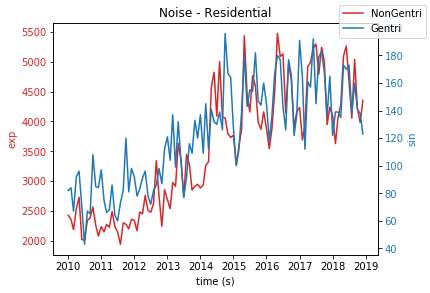

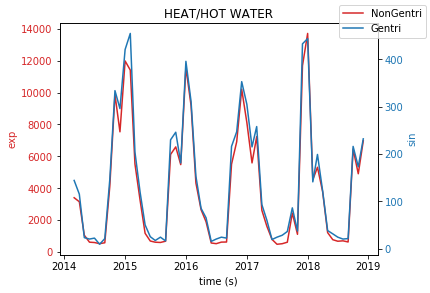

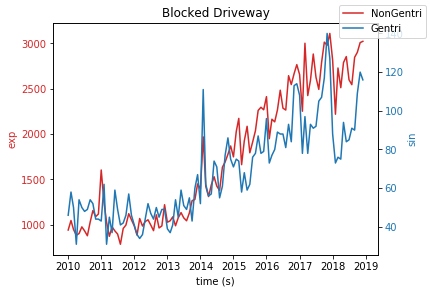

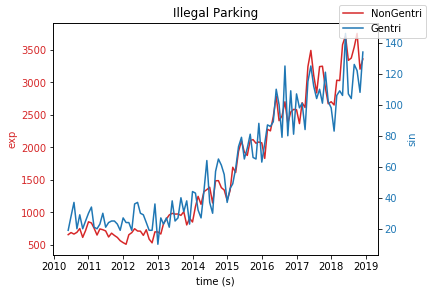

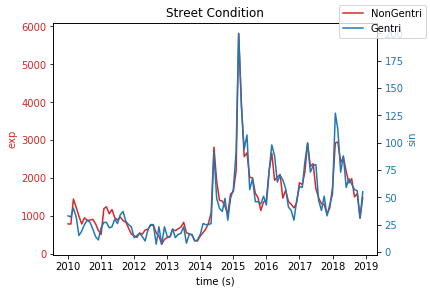

...

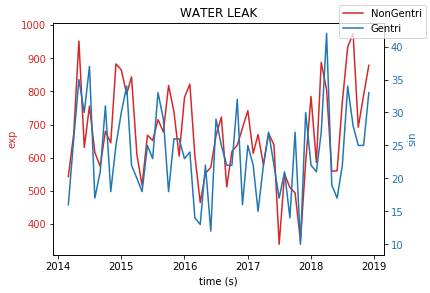

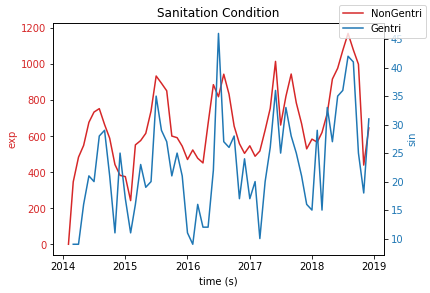

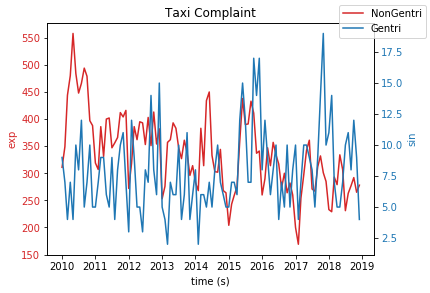

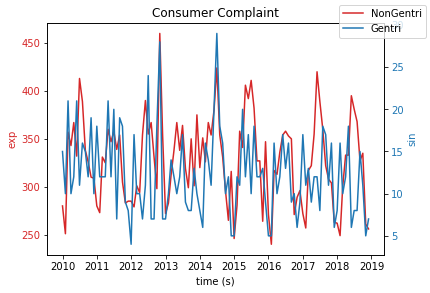

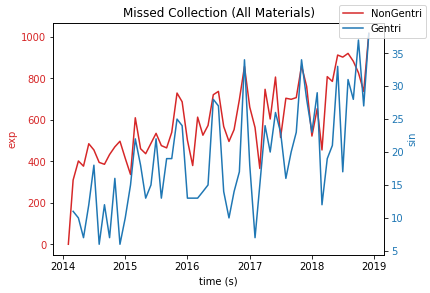

In [212]:
for i in all_311_call.loc[:,'Complaint Type'].value_counts().iloc[:30].index:
    PlotAndCompare(NonGentr_311_call.loc[NonGentr_311_call.loc[:,'Complaint Type']==i,:].groupby('Month').count().Year,
                  Gentr_311_call.loc[Gentr_311_call.loc[:,'Complaint Type']==i,:].groupby('Month').count().Year,i)


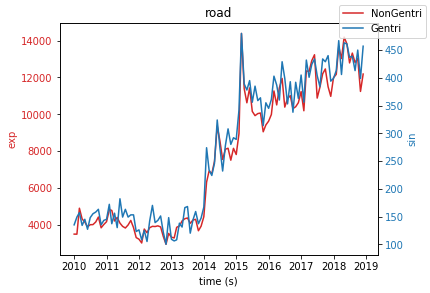

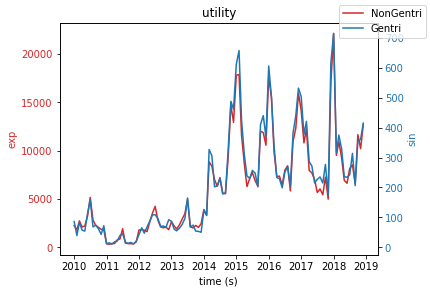

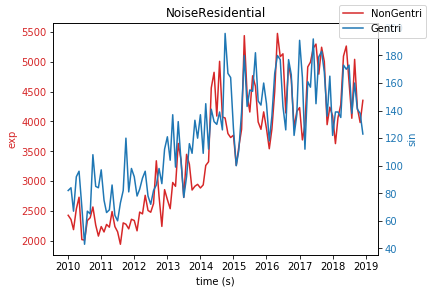

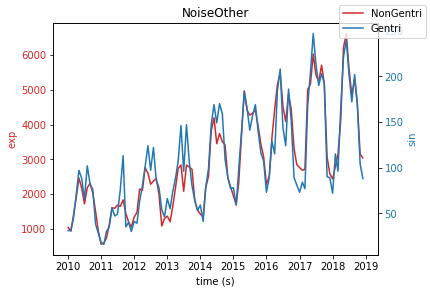

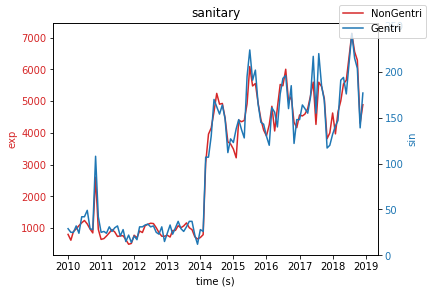

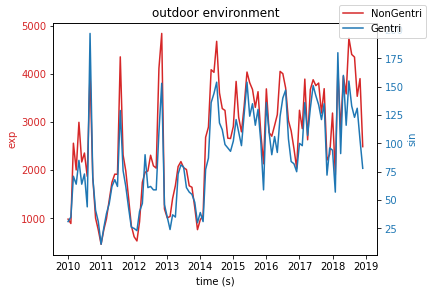

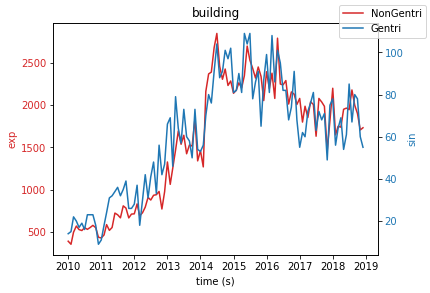

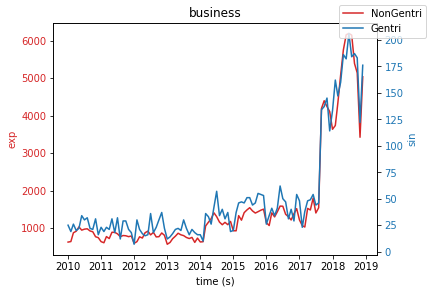

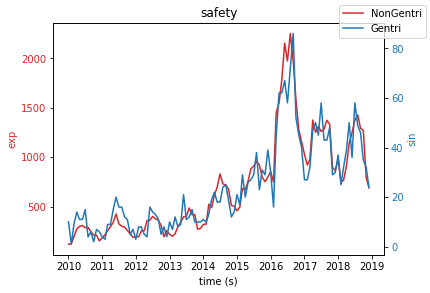

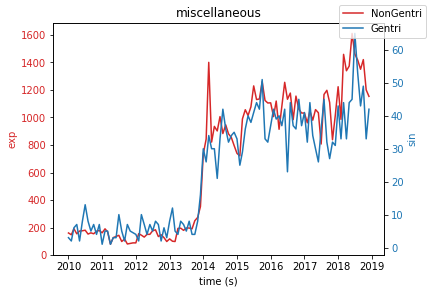

In [213]:
for i in gentri_condition.index:
    PlotAndCompare(NonGentr_311_call.loc[NonGentr_filter==i,:].groupby('Month').count().Year,
                  Gentr_311_call.loc[gentri_filter==i,:].groupby('Month').count().Year,i)

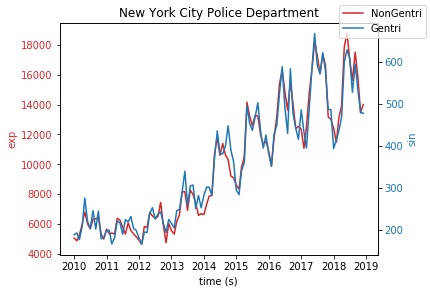

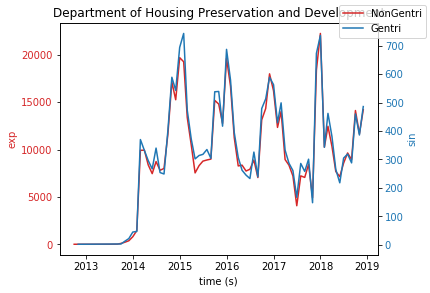

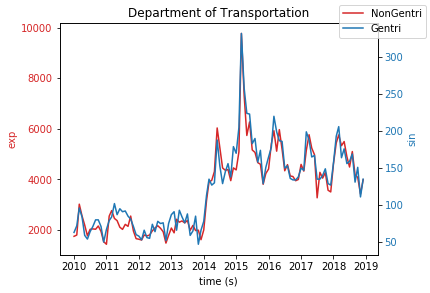

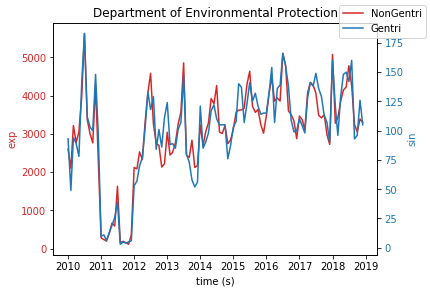

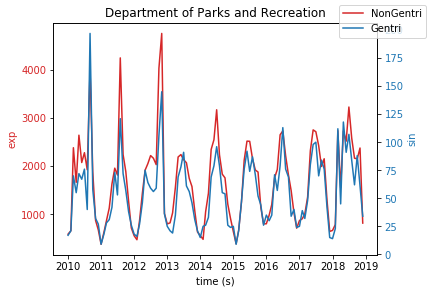

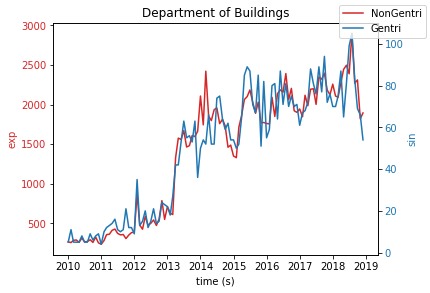

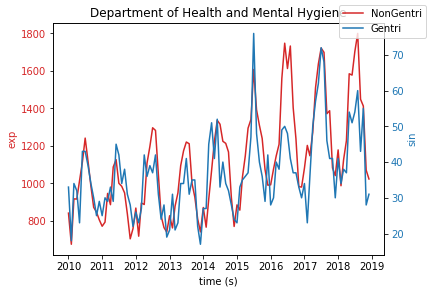

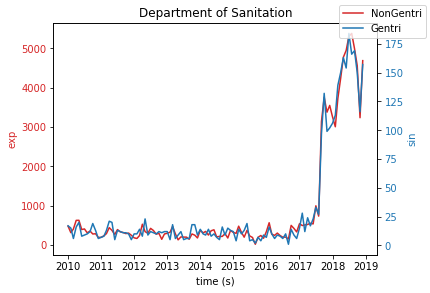

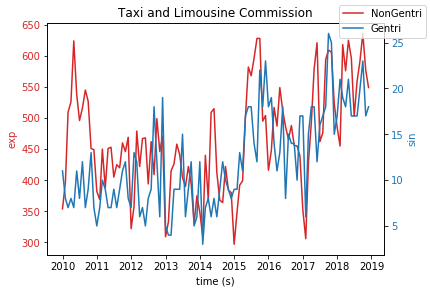

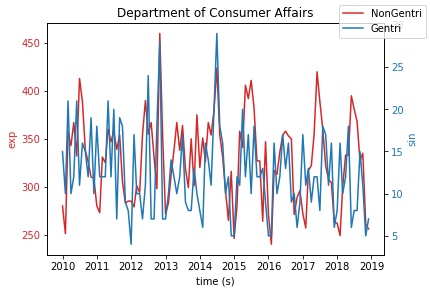

In [226]:
for i in all_311_call.loc[:,'Agency Name'].value_counts().index[:10]:
    PlotAndCompare(NonGentr_311_call.loc[NonGentr_311_call.loc[:,'Agency Name']==i,:].groupby('Month').count().Year,
                  Gentr_311_call.loc[Gentr_311_call.loc[:,'Agency Name']==i,:].groupby('Month').count().Year,i)

3991.9144444444455

In [276]:
gentrified_set = list(dict_qualified_second_step.keys())
populations = final_df.groupby('geoid')['Population'].mean()
gentrified_populations = populations[populations.index.isin(gentrified_set)].mean()
non_gentrified_populations = populations[~populations.index.isin(gentrified_set)].mean()

In [262]:
def LocationTypeFilter(string):
    string = string.lower()
    if 'driveway' in string or 'sidewalk' in string or 'street' in string or 'park' in string or 'traffic' in string or 'vehicle' in string or 'highway' in string or 'bus' in string or 'bicycle' in string or 'bike' in string:
        return 'road'
    elif 'commercial' in string or 'comercial' in string or 'bar' in string:
        return 'commercial'
    elif 'residen' in string or 'family' in string or 'building' in string:
        return 'residential'
    elif string=='nan':
        return 'nan'
    else:
        return 'other'

    
NonGentr_condition_location = NonGentr_311_call.loc[:,'Location Type'].apply(lambda x: LocationTypeFilter(str(x))).value_counts()
gentri_condition_location = Gentr_311_call.loc[:,'Location Type'].apply(lambda x: LocationTypeFilter(str(x))).value_counts()
NonGentr_condition_location = NonGentr_condition_location / NonGentr_condition_location.sum()
gentri_condition_location = gentri_condition_location / gentri_condition_location.sum()
dp(gentri_condition_location)
dp(NonGentr_condition_location)

NonGentr_filter_location = NonGentr_311_call.loc[:,'Location Type'].apply(lambda x: LocationTypeFilter(str(x)))
gentri_filter_location = Gentr_311_call.loc[:,'Location Type'].apply(lambda x: LocationTypeFilter(str(x)))

road           0.386570
residential    0.343917
nan            0.209701
commercial     0.036757
other          0.023056
Name: Location Type, dtype: float64

road           0.382628
residential    0.343294
nan            0.216001
commercial     0.037488
other          0.020588
Name: Location Type, dtype: float64

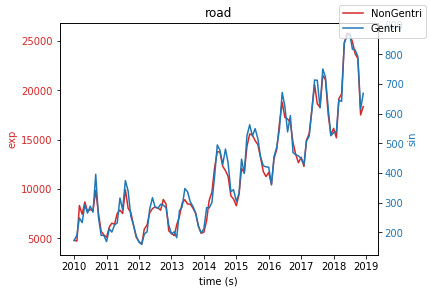

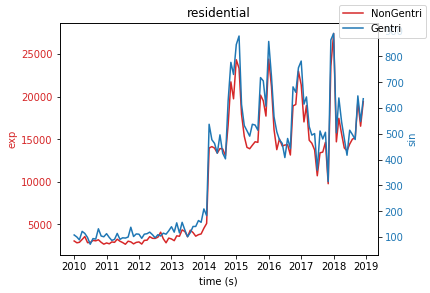

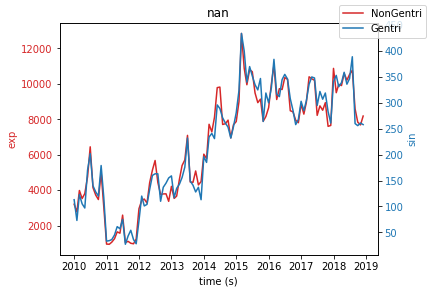

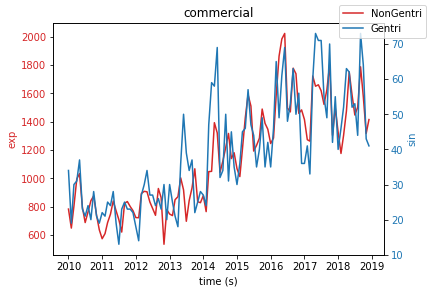

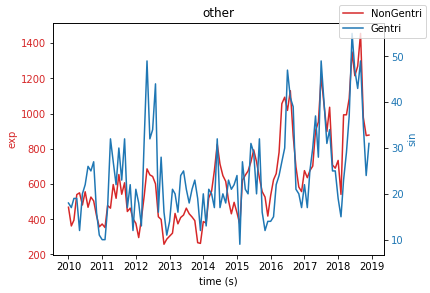

In [281]:
for i in gentri_condition_location.index:
    PlotAndCompare(NonGentr_311_call.loc[NonGentr_filter_location==i,:].groupby('Month').count().Year,
                  Gentr_311_call.loc[gentri_filter_location==i,:].groupby('Month').count().Year,i)


0.44312244294852277


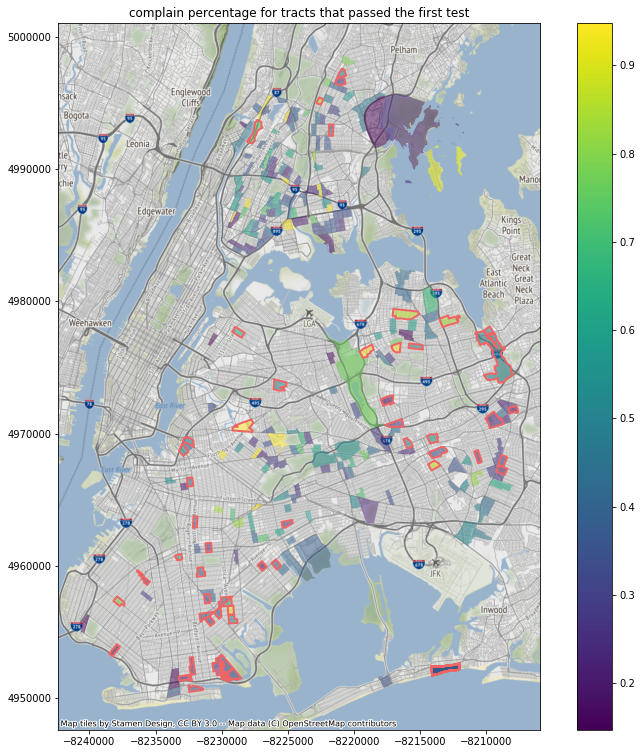

In [323]:
threshold_gentrify = pd.read_csv('Threshold.csv',header=None)
threshold_gentrify.columns = ['geoid','threshold']

geo_df =  GeoDataFrame.from_file('./geoid_shape/geoid_toshape.shp')
interested_geoid = list(set(geo_df.geoid) & set(threshold_gentrify.geoid) & set(qualified_first_step))
geo_df = geo_df.set_index('geoid').loc[interested_geoid,:].merge(threshold_gentrify.set_index('geoid').loc[interested_geoid,:],on='geoid')


complain_df = all_311_call.rename(columns={'TractID': 'geoid'}).groupby('geoid').count().Year
complain_df = pd.DataFrame(complain_df)
interested_geoid = list(set(geo_df.index) & set(complain_df.index))

geo_df = geo_df.loc[interested_geoid,:].merge(complain_df.loc[interested_geoid,:],on='geoid')


df = pd.read_csv('mycensus_all.csv',index_col=0)
df = df.loc[df.year==2009,:]
interested_geoid = list(set(geo_df.index) & set(df.geoid))
geo_df = geo_df.loc[interested_geoid,:].merge(df.set_index('geoid').loc[interested_geoid,:],on='geoid')
geo_df.Year = geo_df.Year/geo_df.Population

df_toplot = geo_df.to_crs(epsg=3857)
df_toplot.Year = df_toplot.Year.clip(df_toplot.Year.quantile(0.05), df_toplot.Year.quantile(0.95)) 

gentrified_tract = [i for i in dict_qualified_second_step.keys() if i in geo_df.index]
gentrified_tract = geo_df.loc[gentrified_tract].to_crs(epsg=3857)
print(gentrified_tract.Year.mean())
f, ax = plt.subplots(1, figsize=(13,13))
ax = df_toplot.plot(ax=ax,column='Year', cmap='viridis', alpha=0.5,legend=True)
ax = gentrified_tract.plot(ax=ax,alpha=1, edgecolor='#ef6565', linewidth=2,facecolor="none")
ctx.add_basemap(ax)
plt.title('complain percentage for tracts that passed the first test')
plt.show()

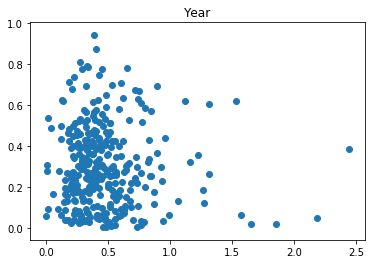

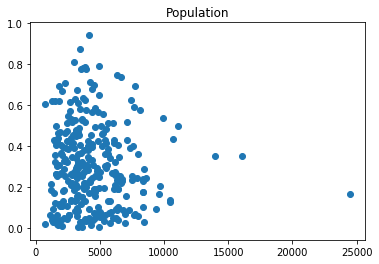

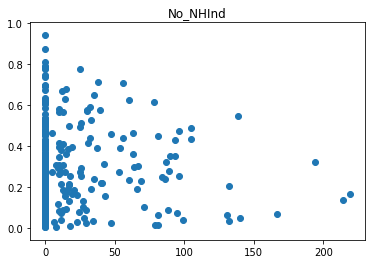

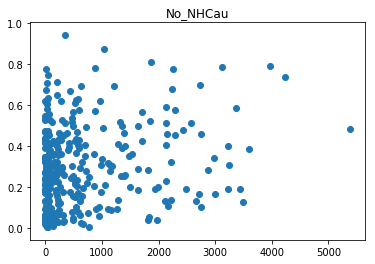

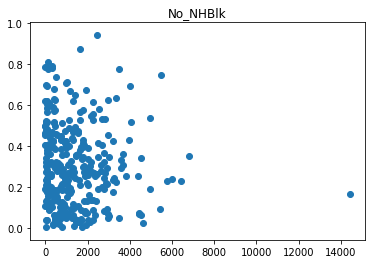

...

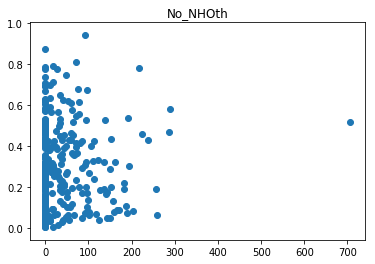

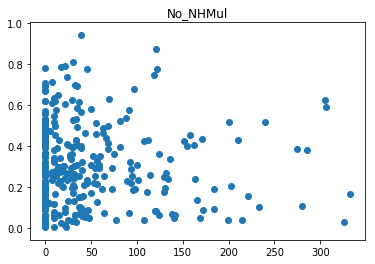

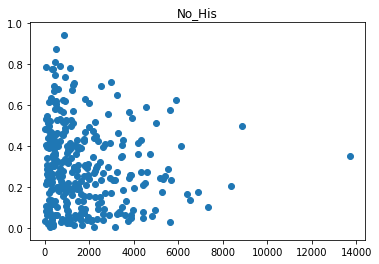

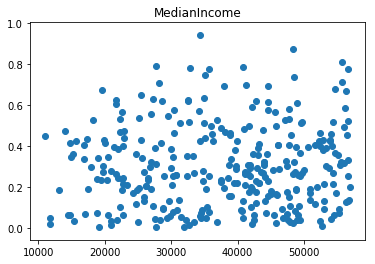

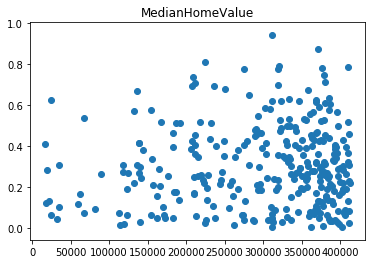

In [327]:
for i in ['Year','Population', 'No_NHInd',
       'No_NHCau', 'No_NHBlk', 'No_NHAsn', 'No_NHHaw', 'No_NHOth', 'No_NHMul',
       'No_His', 'MedianIncome', 'MedianHomeValue']:
    plt.scatter(geo_df.loc[:,i],geo_df.threshold)
    plt.title(i)
    plt.show()

0.44312244294852277


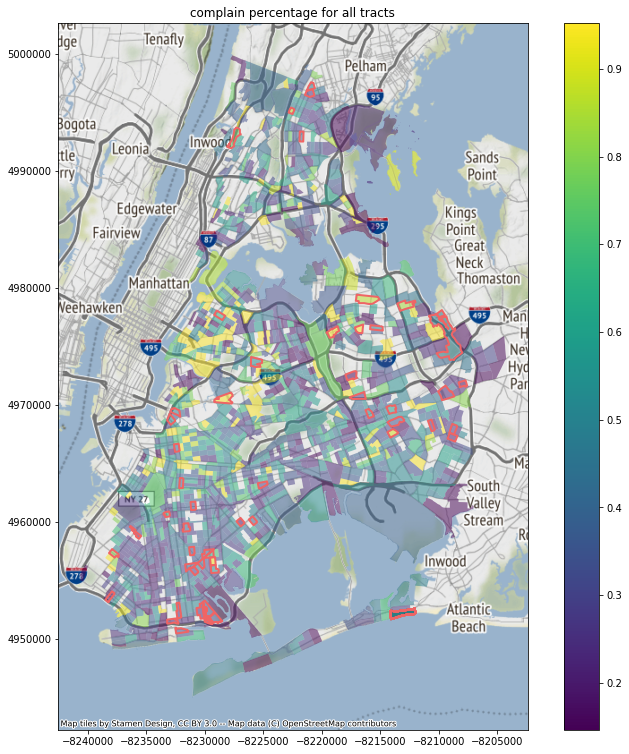

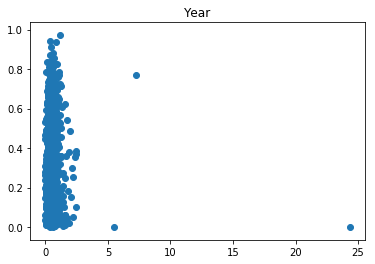

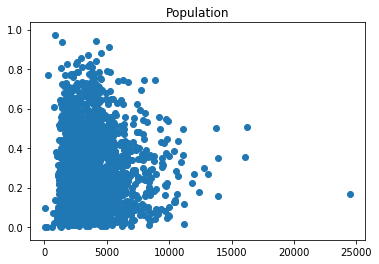

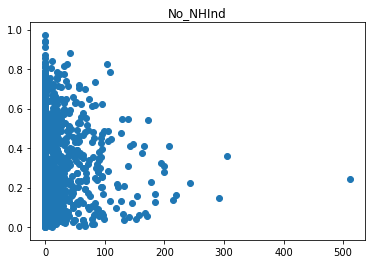

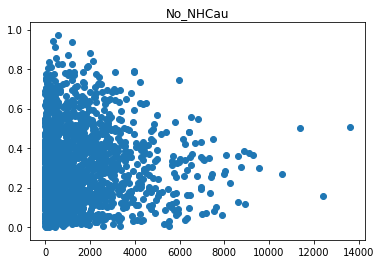

...

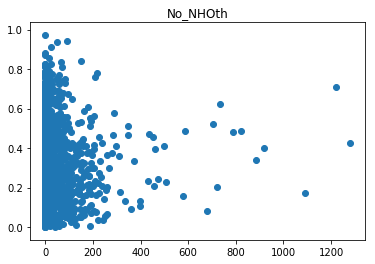

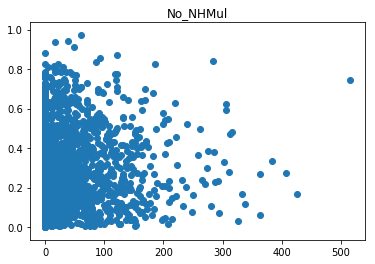

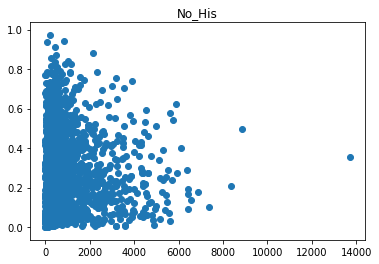

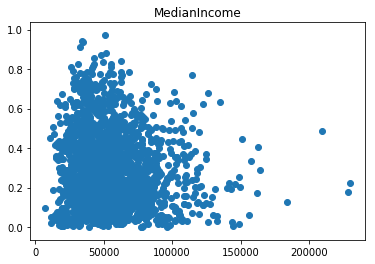

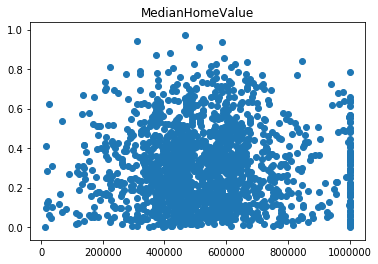

In [5]:
threshold_gentrify = pd.read_csv('Threshold.csv',header=None)
threshold_gentrify.columns = ['geoid','threshold']

geo_df =  GeoDataFrame.from_file('./geoid_shape/geoid_toshape.shp')
interested_geoid = list(set(geo_df.geoid) & set(threshold_gentrify.geoid))
geo_df = geo_df.set_index('geoid').loc[interested_geoid,:].merge(threshold_gentrify.set_index('geoid').loc[interested_geoid,:],on='geoid')


complain_df = all_311_call.rename(columns={'TractID': 'geoid'}).groupby('geoid').count().Year
complain_df = pd.DataFrame(complain_df)
interested_geoid = list(set(geo_df.index) & set(complain_df.index))

geo_df = geo_df.loc[interested_geoid,:].merge(complain_df.loc[interested_geoid,:],on='geoid')


df = pd.read_csv('mycensus_all.csv',index_col=0)
df = df.loc[df.year==2009,:]
interested_geoid = list(set(geo_df.index) & set(df.geoid))
geo_df = geo_df.loc[interested_geoid,:].merge(df.set_index('geoid').loc[interested_geoid,:],on='geoid')
geo_df.Year = geo_df.Year/geo_df.Population

df_toplot = geo_df.to_crs(epsg=3857)
df_toplot.Year = df_toplot.Year.clip(df_toplot.Year.quantile(0.05), df_toplot.Year.quantile(0.95)) 

gentrified_tract = [i for i in dict_qualified_second_step.keys() if i in geo_df.index]
gentrified_tract = geo_df.loc[gentrified_tract].to_crs(epsg=3857)
print(gentrified_tract.Year.mean())
f, ax = plt.subplots(1, figsize=(13,13))
ax = df_toplot.plot(ax=ax,column='Year', cmap='viridis', alpha=0.5,legend=True)
ax = gentrified_tract.plot(ax=ax,alpha=1, edgecolor='#ef6565', linewidth=2,facecolor="none")
ctx.add_basemap(ax)
plt.title('complain percentage for all tracts')
plt.show()

for i in ['Year','Population', 'No_NHInd',
       'No_NHCau', 'No_NHBlk', 'No_NHAsn', 'No_NHHaw', 'No_NHOth', 'No_NHMul',
       'No_His', 'MedianIncome', 'MedianHomeValue']:
    plt.scatter(geo_df.loc[:,i],geo_df.threshold)
    plt.title(i)
    plt.show()

In [25]:
threshold_coverter = {}
for i in range(len(threshold_gentrify)):
    if threshold_gentrify.iloc[i,0] in qualified_first_step:
        threshold_coverter[threshold_gentrify.iloc[i,0]]=threshold_gentrify.iloc[i,1]
    else:
        threshold_coverter[threshold_gentrify.iloc[i,0]]=np.nan

def get_threshold(x):
    x = int(x)
    if x in threshold_coverter:
        return threshold_coverter[x]
    else:
        return np.nan
    
#all_311_call_threshold = pd.read_hdf('311CallALL.h5',key='data').dropna(subset=['TractID'])


In [32]:
def LocationTypeFilter(string):
    string = string.lower()
    if 'driveway' in string or 'sidewalk' in string or 'street' in string or 'park' in string or 'traffic' in string or 'vehicle' in string or 'highway' in string or 'bus' in string or 'bicycle' in string or 'bike' in string:
        return 'road'
    elif 'commercial' in string or 'comercial' in string or 'bar' in string:
        return 'commercial'
    elif 'residen' in string or 'family' in string or 'building' in string:
        return 'residential'
    elif string=='nan':
        return 'nan'
    else:
        return 'other'
def ComplaintTypeFilter(string):
    string = string.lower()
    if 'noise - residential' in string:
        return 'NoiseResidential'
    elif 'noise' in string:
        return 'NoiseOther'
    elif 'driveway' in string or 'sidewalk' in string or 'street' in string or 'park' in string or 'traffic' in string or 'vehicle' in string or 'highway' in string or 'bus' in string or 'bicycle' in string or 'bike' in string:
        return 'road'
    elif 'tree' in string or 'snow' in string or 'litter' in string or 'graffiti' in string or 'paint' in string or 'mosquitoes' in string or 'curb' in string:
        return 'outdoor environment'
    elif 'sanita' in string or 'dirty' in string or 'rodent' in string or 'air' in string or 'smok' in string or 'electron' in string or 'waste' in string or 'hazardous' in string or 'lead' in string or 'public' in string:
        return 'sanitary'
    elif 'plumbing' in string or 'sewer' in string or 'electric' in string or 'food' in string or 'water' in string or 'heat' in string or 'boilers' in string or 'appliance' in string:
        return 'utility'
    elif 'door' in string or 'flooring' in string or 'building' in string or 'elevator' in string or 'broken' in string or 'maintenance' in string or 'construction' in string or 'construction' in string:
        return 'building'
    elif 'taxi' in string or 'consumer' in string or 'vending' in string or 'collection' in string:
        return 'business'
    elif 'safe' in string or 'homeless' in string or 'drinking' in string or 'dog' in string or 'illegal' in string or 'disorder' in string or 'drug' in string or 'emergency' in string:
        return 'safety'
    else:
        return 'miscellaneous'


all_311_call_threshold.loc[:,'Threshold'] = all_311_call_threshold.loc[:,'TractID'].apply(lambda x: get_threshold(x))
Gentr_filter_location = all_311_call_threshold.loc[:,'Location Type'].apply(lambda x: LocationTypeFilter(str(x)))
gentri_filter = all_311_call_threshold.loc[:,'Complaint Type'].apply(lambda x: ComplaintTypeFilter(str(x)))

In [29]:
all_311_call_threshold

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Address Type,...,Longitude,Location,TractID,1stClose,2ndClose,3rdClose,4rdClose,Year,Month,Threshold
0,17555738.0,06/30/2010 01:30:42 PM,08/09/2010 12:00:00 AM,DSNY,Department of Sanitation,Graffiti,Graffiti,Mixed Use,10032,ADDRESS,...,-73.941411,"(40.8337326, -73.9414111)",3.606102e+10,3.606102e+10,3.606102e+10,3.606103e+10,3.606102e+10,2010,2010-06,0.384985
1,18316923.0,07/21/2010 08:34:00 PM,07/21/2010 08:41:00 PM,DEP,Department of Environmental Protection,Water System,Fire Hydrant Emergency (FHE),NaN,10469,INTERSECTION,...,-73.861755,"(40.8596461, -73.8617546)",3.600503e+10,3.600503e+10,3.600503e+10,3.600503e+10,3.600503e+10,2010,2010-07,NaN
2,18451716.0,08/10/2010 08:52:27 PM,08/10/2010 09:06:43 PM,NYPD,New York City Police Department,Blocked Driveway,Partial Access,Street/Sidewalk,11421,ADDRESS,...,-73.851141,"(40.6978223, -73.8511413)",3.608100e+10,3.608106e+10,3.608106e+10,3.608100e+10,3.608100e+10,2010,2010-08,NaN
3,18743157.0,09/22/2010 02:57:16 PM,10/12/2010 08:34:17 AM,DOT,Department of Transportation,Broken Parking Meter,Coin or Card Did Not Register,Street,11210,INTERSECTION,...,-73.945066,"(40.6172116, -73.9450662)",3.604708e+10,3.604707e+10,3.604707e+10,3.604708e+10,3.604708e+10,2010,2010-09,NaN
4,18603798.0,09/01/2010 09:27:04 AM,09/02/2010 12:00:00 AM,DSNY,Department of Sanitation,Graffiti,Graffiti,Comercial,10002,ADDRESS,...,-73.984466,"(40.7184044, -73.9844663)",3.606100e+10,3.606100e+10,3.606100e+10,3.606100e+10,3.606100e+10,2010,2010-09,NaN
5,19095006.0,11/10/2010 12:34:12 PM,11/26/2010 01:07:04 AM,DCA,Department of Consumer Affairs,Consumer Complaint,Exchange/Refund/Return,NaN,10036,INTERSECTION,...,-73.990276,"(40.7565681, -73.990276)",3.606101e+10,3.606101e+10,3.606101e+10,3.606101e+10,3.606101e+10,2010,2010-11,NaN
6,16859340.0,06/14/2010 12:38:12 PM,06/15/2010 04:11:29 PM,DOT,Department of Transportation,Broken Muni Meter,Parking Card Stuck in Meter,Street,10028,INTERSECTION,...,-73.959310,"(40.7801743, -73.95931)",3.606102e+10,3.606102e+10,3.606102e+10,3.606102e+10,3.606102e+10,2010,2010-06,NaN
7,16537711.0,04/27/2010 06:30:24 PM,06/14/2010 12:00:00 AM,DSNY,Department of Sanitation,Graffiti,Graffiti,Mixed Use,10013,ADDRESS,...,-73.998871,"(40.7171648, -73.9988709)",3.606100e+10,3.606100e+10,3.606100e+10,3.606100e+10,3.606101e+10,2010,2010-04,NaN
8,19094856.0,11/10/2010 09:58:12 PM,11/11/2010 03:10:31 AM,NYPD,New York City Police Department,Blocked Driveway,Partial Access,Street/Sidewalk,11237,ADDRESS,...,-73.907549,"(40.6971046, -73.907549)",3.608106e+10,3.608106e+10,3.608106e+10,3.604704e+10,3.608106e+10,2010,2010-11,NaN
9,16000222.0,02/13/2010 03:10:05 PM,12/16/2011 12:00:00 AM,DOB,Department of Buildings,General Construction/Plumbing,Building Shaking/Vibrating/Structural Stability,NaN,11372,ADDRESS,...,-73.882313,"(40.7499649, -73.8823126)",3.608103e+10,3.608103e+10,3.608103e+10,3.608103e+10,3.608105e+10,2010,2010-02,0.361820


In [34]:
all_311_call_threshold.Threshold.groupby(Gentr_filter_location).apply(lambda x:np.nanmean(x))

Location Type
commercial     0.307498
nan            0.299161
other          0.296741
residential    0.289418
road           0.303442
Name: Threshold, dtype: float64

In [35]:
all_311_call_threshold.Threshold.groupby(gentri_filter).apply(lambda x:np.nanmean(x))

Complaint Type
NoiseOther             0.306415
NoiseResidential       0.286910
building               0.293810
business               0.293614
miscellaneous          0.295286
outdoor environment    0.305442
road                   0.303326
safety                 0.298162
sanitary               0.296529
utility                0.291321
Name: Threshold, dtype: float64

In [36]:
all_311_call_threshold.Threshold.groupby(all_311_call_threshold['Address Type']).apply(lambda x:np.nanmean(x))

Address Type
ADDRESS         0.296238
BLOCKFACE       0.307502
INTERSECTION    0.300449
LATLONG         0.299689
PLACENAME       0.305091
Name: Threshold, dtype: float64

-----
**year on year 311 call**

In [63]:
df = pd.read_csv('Threshold_2.csv')
threshold_dict={i:list(df[df.geoid==i].sort_values('year').Threshold) for i in df.geoid.unique()}


In [64]:
from IPython.display import display as dp
threshold_dict={i:list(df[df.geoid==i].sort_values('year').Threshold) for i in df.geoid.unique()}

threshold_coverter = {}
for i in df.geoid.unique():
    if i in qualified_first_step:
        threshold_coverter[i]=list(df[df.geoid==i].sort_values('year').Threshold)
    else:
        threshold_coverter[i]=[np.nan for i in range(9)]

def get_threshold(x,n):
    x = int(x)
    if x in threshold_coverter:
        return threshold_coverter[x][n]
    else:
        return np.nan
    
all_311_call_threshold = pd.read_hdf('311CallALL.h5',key='data').dropna(subset=['TractID'])
all_311_call_threshold = all_311_call_threshold[all_311_call_threshold.Year==2014]
all_311_call_threshold.loc[:,'Threshold'] = all_311_call_threshold.loc[:,'TractID'].apply(lambda x: get_threshold(x,4))
Gentr_filter_location = all_311_call_threshold.loc[:,'Location Type'].apply(lambda x: LocationTypeFilter(str(x)))
gentri_filter = all_311_call_threshold.loc[:,'Complaint Type'].apply(lambda x: ComplaintTypeFilter(str(x)))

dp(all_311_call_threshold.Threshold.groupby(Gentr_filter_location).apply(lambda x:np.nanmean(x)))
dp(all_311_call_threshold.Threshold.groupby(gentri_filter).apply(lambda x:np.nanmean(x)))

Location Type
commercial     0.338671
nan            0.311469
other          0.333775
residential    0.277177
road           0.314271
Name: Threshold, dtype: float64

Complaint Type
NoiseOther             0.323659
NoiseResidential       0.277221
building               0.290392
business               0.294976
miscellaneous          0.292810
outdoor environment    0.299201
road                   0.322370
safety                 0.298638
sanitary               0.294280
utility                0.277956
Name: Threshold, dtype: float64

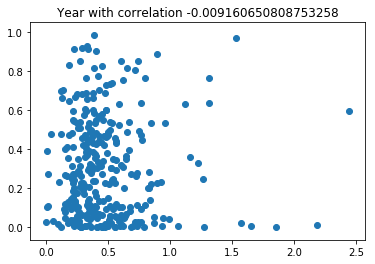

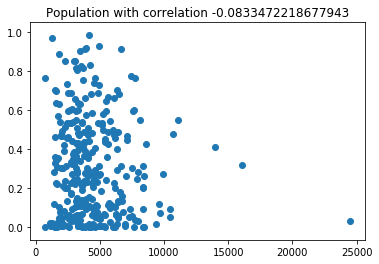

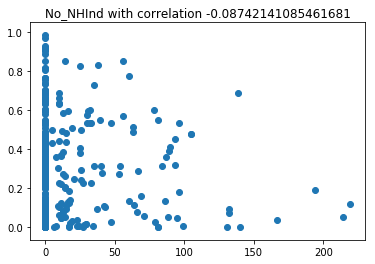

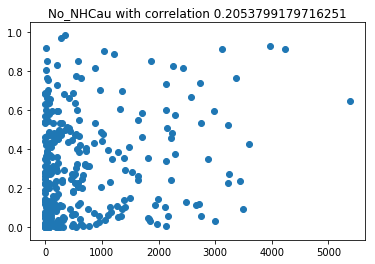

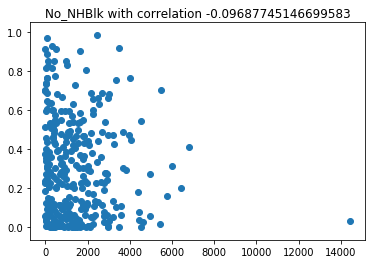

...

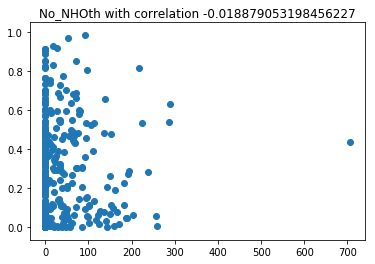

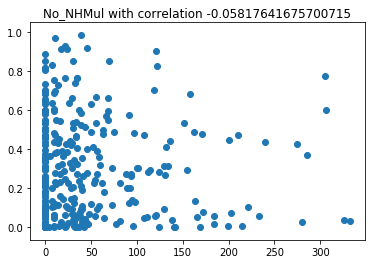

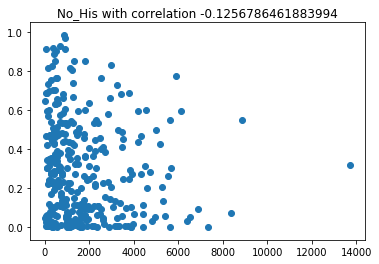

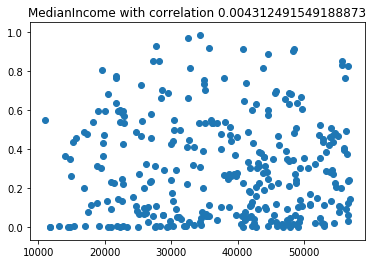

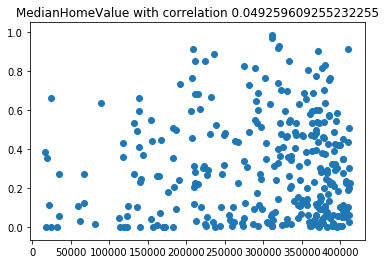

In [73]:
threshold_gentrify = pd.read_csv('Threshold.csv',header=None)
threshold_gentrify.columns = ['geoid','threshold']
threshold_gentrify.threshold = threshold_gentrify.geoid.apply(lambda x: get_threshold(x,4))

geo_df =  GeoDataFrame.from_file('./geoid_shape/geoid_toshape.shp')
interested_geoid = list(set(geo_df.geoid) & set(threshold_gentrify.geoid) & set(qualified_first_step))
geo_df = geo_df.set_index('geoid').loc[interested_geoid,:].merge(threshold_gentrify.set_index('geoid').loc[interested_geoid,:],on='geoid')


complain_df = all_311_call.rename(columns={'TractID': 'geoid'}).groupby('geoid').count().Year
complain_df = pd.DataFrame(complain_df)
interested_geoid = list(set(geo_df.index) & set(complain_df.index))

geo_df = geo_df.loc[interested_geoid,:].merge(complain_df.loc[interested_geoid,:],on='geoid')


df = pd.read_csv('mycensus_all.csv',index_col=0)
df = df.loc[df.year==2009,:]
interested_geoid = list(set(geo_df.index) & set(df.geoid))
geo_df = geo_df.loc[interested_geoid,:].merge(df.set_index('geoid').loc[interested_geoid,:],on='geoid')
geo_df.Year = geo_df.Year/geo_df.Population


for i in ['Year','Population', 'No_NHInd',
       'No_NHCau', 'No_NHBlk', 'No_NHAsn', 'No_NHHaw', 'No_NHOth', 'No_NHMul',
       'No_His', 'MedianIncome', 'MedianHomeValue']:
    plt.scatter(geo_df.loc[:,i],geo_df.threshold)
    plt.title('{} with correlation {}'.format(i,np.corrcoef(geo_df.loc[:,i],geo_df.threshold)[1,0]))
    plt.show()

----
----

# feature generation

In [4]:
def LocationTypeFilter(string):
    string = string.lower()
    if 'driveway' in string or 'sidewalk' in string or 'street' in string or 'park' in string or 'traffic' in string or 'vehicle' in string or 'highway' in string or 'bus' in string or 'bicycle' in string or 'bike' in string:
        return 'road'
    elif 'commercial' in string or 'comercial' in string or 'bar' in string:
        return 'commercial'
    elif 'residen' in string or 'family' in string or 'building' in string:
        return 'residential'
    elif string=='nan':
        return 'nan'
    else:
        return 'other'
def ComplaintTypeFilter(string):
    string = string.lower()
    if 'noise - residential' in string:
        return 'NoiseResidential'
    elif 'noise' in string:
        return 'NoiseOther'
    elif 'driveway' in string or 'sidewalk' in string or 'street' in string or 'park' in string or 'traffic' in string or 'vehicle' in string or 'highway' in string or 'bus' in string or 'bicycle' in string or 'bike' in string:
        return 'road'
    elif 'tree' in string or 'snow' in string or 'litter' in string or 'graffiti' in string or 'paint' in string or 'mosquitoes' in string or 'curb' in string:
        return 'outdoor environment'
    elif 'sanita' in string or 'dirty' in string or 'rodent' in string or 'air' in string or 'smok' in string or 'electron' in string or 'waste' in string or 'hazardous' in string or 'lead' in string or 'public' in string:
        return 'sanitary'
    elif 'plumbing' in string or 'sewer' in string or 'electric' in string or 'food' in string or 'water' in string or 'heat' in string or 'boilers' in string or 'appliance' in string:
        return 'utility'
    elif 'door' in string or 'flooring' in string or 'building' in string or 'elevator' in string or 'broken' in string or 'maintenance' in string or 'construction' in string or 'construction' in string:
        return 'building'
    elif 'taxi' in string or 'consumer' in string or 'vending' in string or 'collection' in string:
        return 'business'
    elif 'safe' in string or 'homeless' in string or 'drinking' in string or 'dog' in string or 'illegal' in string or 'disorder' in string or 'drug' in string or 'emergency' in string:
        return 'safety'
    else:
        return 'miscellaneous'

df = pd.read_csv('mycensus_all.csv',index_col=0)
all_311_call_threshold = pd.read_hdf('311CallALL.h5',key='data').dropna(subset=['TractID']).rename(columns={'TractID': 'geoid'})
all_311_call_threshold = all_311_call_threshold[all_311_call_threshold.Month!='NaT']
all_311_call_threshold.loc[:,'Location Type'] = all_311_call_threshold.loc[:,'Location Type'].apply(lambda x: LocationTypeFilter(str(x)))
all_311_call_threshold.loc[:,'Complaint Type'] = all_311_call_threshold.loc[:,'Complaint Type'].apply(lambda x: ComplaintTypeFilter(str(x)))

In [5]:
from tqdm import tqdm
interested_geoid = list(set(df.geoid) & set(all_311_call_threshold.geoid))
tract = interested_geoid[0]
result_series = all_311_call_threshold.groupby(['geoid','Complaint Type','Month']).count().Year


Monthes=all_311_call_threshold.Month.unique()
Monthes.sort()
NoiseOther_TimeSeries=pd.DataFrame(columns=Monthes)
NoiseResidential_TimeSeries=pd.DataFrame(columns=Monthes)

for geoid in tqdm(interested_geoid):
    try:
        one_row=result_series[geoid]['NoiseOther'].reset_index().T
        one_row.columns=one_row.iloc[0]
        one_row.drop(one_row.index[0],inplace=True)
        one_row.index=[geoid]    
    except:
        one_row = pd.DataFrame({i:0 for i in Monthes},index=[geoid])
    NoiseOther_TimeSeries=pd.concat([NoiseOther_TimeSeries,one_row],sort=True)
    
    try:
        one_row=result_series[geoid]['NoiseResidential'].reset_index().T
        one_row.columns=one_row.iloc[0]
        one_row.drop(one_row.index[0],inplace=True)
        one_row.index=[geoid]    
    except:
        one_row = pd.DataFrame({i:0 for i in Monthes},index=[geoid])
    NoiseResidential_TimeSeries=pd.concat([NoiseResidential_TimeSeries,one_row],sort=True)

100%|██████████| 1744/1744 [00:39<00:00, 44.11it/s]


In [160]:
df = pd.read_csv('mycensus_all.csv',index_col=0)
print(len(set(all_311_call_threshold.geoid)))
interested_geoid = list(set(df.geoid) & set(all_311_call_threshold.geoid))
print(len(interested_geoid))
interested_geoid = list(set(qualified_first_step) & set(interested_geoid))
print(len(interested_geoid))
interested_geoid = list(set(dict_qualified_second_step.keys()) & set(interested_geoid))
print(len(interested_geoid))

2164
1744
317
73


In [6]:
from tqdm import tqdm
interested_geoid = list(set(df.geoid) & set(all_311_call_threshold.geoid))
tract = interested_geoid[0]
df = pd.read_csv('mycensus_all.csv',index_col=0)
df_NHCau = df.groupby(['geoid','year']).mean().No_NHCau
df_His = df.groupby(['geoid','year']).mean().No_His


Monthes=df.year.unique()
Monthes.sort()
NHCau_TimeSeries=pd.DataFrame(columns=Monthes)
His_TimeSeries=pd.DataFrame(columns=Monthes)

for geoid in tqdm(interested_geoid):
    try:
        one_row=df_NHCau[geoid].reset_index().T
        one_row.columns=one_row.iloc[0]
        one_row.drop(one_row.index[0],inplace=True)
        one_row.index=[geoid]    
    except:
        one_row = pd.DataFrame({i:0 for i in Monthes},index=[geoid])
    NHCau_TimeSeries=pd.concat([NHCau_TimeSeries,one_row],sort=True)
    
    try:
        one_row=df_His[geoid].reset_index().T
        one_row.columns=one_row.iloc[0]
        one_row.drop(one_row.index[0],inplace=True)
        one_row.index=[geoid]    
    except:
        one_row = pd.DataFrame({i:0 for i in Monthes},index=[geoid])
    His_TimeSeries=pd.concat([His_TimeSeries,one_row],sort=True)

100%|██████████| 1744/1744 [00:08<00:00, 203.98it/s]


In [9]:
from IPython.display import display as dp


dp(NoiseOther_TimeSeries.head())
dp(NoiseResidential_TimeSeries.head())
dp(NHCau_TimeSeries.head())
dp(His_TimeSeries.head())
upload = {'NoiseOther_TimeSeries':NoiseOther_TimeSeries,
          'NoiseResidential_TimeSeries':NoiseResidential_TimeSeries,
          'NHCau_TimeSeries':NHCau_TimeSeries,
          'His_TimeSeries':His_TimeSeries
         }



,2010-01,2010-02,2010-03,2010-04,2010-05,2010-06,2010-07,2010-08,2010-09,2010-10,...,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08,2018-09,2018-10,2018-11,2018-12
3.608105e+10,NaN,1,1,NaN,1,NaN,NaN,3,NaN,NaN,...,2,2,1,2,5,3,3,3,5,2
3.604705e+10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,...,NaN,1,3,NaN,NaN,NaN,NaN,1,NaN,NaN
3.604706e+10,NaN,NaN,NaN,NaN,NaN,3,1,NaN,1,2,...,NaN,NaN,NaN,1,1,NaN,NaN,3,1,NaN
3.604707e+10,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,1,1,...,1,2,2,NaN,1,2,3,2,1,2
3.608107e+10,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,...,1,3,2,8,4,6,1,5,3,2


,2010-01,2010-02,2010-03,2010-04,2010-05,2010-06,2010-07,2010-08,2010-09,2010-10,...,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08,2018-09,2018-10,2018-11,2018-12
3.608105e+10,NaN,1,NaN,1,NaN,3,6,NaN,1,NaN,...,2,2,3,NaN,3,2,6,3,1,2
3.604705e+10,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,1,...,1,NaN,1,NaN,3,NaN,1,NaN,NaN,1
3.604706e+10,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,1,2,NaN,NaN,1,NaN,2,NaN,NaN
3.604707e+10,NaN,NaN,NaN,1,1,2,NaN,2,NaN,NaN,...,3,NaN,3,2,1,1,2,2,1,NaN
3.608107e+10,NaN,NaN,NaN,NaN,4,1,2,2,3,NaN,...,1,4,5,2,4,4,2,2,2,3


,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
3.608105e+10,88.0,88.0,99.0,119.0,167.0,166.0,102.0,137.0,144.0,155.0
3.604705e+10,1159.0,984.0,935.0,1004.0,992.0,1065.0,1076.0,1115.0,1010.0,1085.0
3.604706e+10,3847.0,3499.0,3676.0,4144.0,4137.0,4301.0,4247.0,4213.0,4207.0,4034.0
3.604707e+10,374.0,315.0,324.0,316.0,294.0,325.0,302.0,267.0,289.0,223.0
3.608107e+10,187.0,150.0,171.0,93.0,214.0,238.0,198.0,163.0,193.0,178.0


,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
3.608105e+10,693.0,445.0,494.0,594.0,624.0,527.0,568.0,770.0,850.0,907.0
3.604705e+10,136.0,222.0,322.0,359.0,218.0,321.0,145.0,187.0,239.0,215.0
3.604706e+10,74.0,62.0,105.0,102.0,95.0,36.0,35.0,0.0,0.0,40.0
3.604707e+10,178.0,210.0,235.0,260.0,215.0,162.0,181.0,160.0,153.0,294.0
3.608107e+10,432.0,426.0,505.0,518.0,371.0,377.0,431.0,219.0,317.0,512.0


In [159]:
all_311_call_threshold

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Address Type,...,Latitude,Longitude,Location,geoid,1stClose,2ndClose,3rdClose,4rdClose,Year,Month
0,17555738.0,06/30/2010 01:30:42 PM,08/09/2010 12:00:00 AM,DSNY,Department of Sanitation,outdoor environment,Graffiti,other,10032,ADDRESS,...,40.833733,-73.941411,"(40.8337326, -73.9414111)",3.606102e+10,3.606102e+10,3.606102e+10,3.606103e+10,3.606102e+10,2010,2010-06
1,18316923.0,07/21/2010 08:34:00 PM,07/21/2010 08:41:00 PM,DEP,Department of Environmental Protection,utility,Fire Hydrant Emergency (FHE),nan,10469,INTERSECTION,...,40.859646,-73.861755,"(40.8596461, -73.8617546)",3.600503e+10,3.600503e+10,3.600503e+10,3.600503e+10,3.600503e+10,2010,2010-07
2,18451716.0,08/10/2010 08:52:27 PM,08/10/2010 09:06:43 PM,NYPD,New York City Police Department,road,Partial Access,road,11421,ADDRESS,...,40.697822,-73.851141,"(40.6978223, -73.8511413)",3.608100e+10,3.608106e+10,3.608106e+10,3.608100e+10,3.608100e+10,2010,2010-08
3,18743157.0,09/22/2010 02:57:16 PM,10/12/2010 08:34:17 AM,DOT,Department of Transportation,road,Coin or Card Did Not Register,road,11210,INTERSECTION,...,40.617212,-73.945066,"(40.6172116, -73.9450662)",3.604708e+10,3.604707e+10,3.604707e+10,3.604708e+10,3.604708e+10,2010,2010-09
4,18603798.0,09/01/2010 09:27:04 AM,09/02/2010 12:00:00 AM,DSNY,Department of Sanitation,outdoor environment,Graffiti,commercial,10002,ADDRESS,...,40.718404,-73.984466,"(40.7184044, -73.9844663)",3.606100e+10,3.606100e+10,3.606100e+10,3.606100e+10,3.606100e+10,2010,2010-09
5,19095006.0,11/10/2010 12:34:12 PM,11/26/2010 01:07:04 AM,DCA,Department of Consumer Affairs,business,Exchange/Refund/Return,nan,10036,INTERSECTION,...,40.756568,-73.990276,"(40.7565681, -73.990276)",3.606101e+10,3.606101e+10,3.606101e+10,3.606101e+10,3.606101e+10,2010,2010-11
6,16859340.0,06/14/2010 12:38:12 PM,06/15/2010 04:11:29 PM,DOT,Department of Transportation,building,Parking Card Stuck in Meter,road,10028,INTERSECTION,...,40.780174,-73.959310,"(40.7801743, -73.95931)",3.606102e+10,3.606102e+10,3.606102e+10,3.606102e+10,3.606102e+10,2010,2010-06
7,16537711.0,04/27/2010 06:30:24 PM,06/14/2010 12:00:00 AM,DSNY,Department of Sanitation,outdoor environment,Graffiti,other,10013,ADDRESS,...,40.717165,-73.998871,"(40.7171648, -73.9988709)",3.606100e+10,3.606100e+10,3.606100e+10,3.606100e+10,3.606101e+10,2010,2010-04
8,19094856.0,11/10/2010 09:58:12 PM,11/11/2010 03:10:31 AM,NYPD,New York City Police Department,road,Partial Access,road,11237,ADDRESS,...,40.697105,-73.907549,"(40.6971046, -73.907549)",3.608106e+10,3.608106e+10,3.608106e+10,3.604704e+10,3.608106e+10,2010,2010-11
9,16000222.0,02/13/2010 03:10:05 PM,12/16/2011 12:00:00 AM,DOB,Department of Buildings,utility,Building Shaking/Vibrating/Structural Stability,nan,11372,ADDRESS,...,40.749965,-73.882313,"(40.7499649, -73.8823126)",3.608103e+10,3.608103e+10,3.608103e+10,3.608103e+10,3.608105e+10,2010,2010-02


----
----
run basical linear regression to check accuracy

# regression on tracts that fulfill the first condition

100%|██████████| 317/317 [00:08<00:00, 39.03it/s]
C:\Users\richard\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              threshold   R-squared:                       0.599
Model:                            OLS   Adj. R-squared:                  0.595
Method:                 Least Squares   F-statistic:                     130.1
Date:                Sun, 25 Oct 2020   Prob (F-statistic):          5.97e-295
Time:                        14:17:11   Log-Likelihood:                 586.29
No. Observations:                1585   AIC:                            -1135.
Df Residuals:                    1566   BIC:                            -1033.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                           0.2322      0.016     14.769      0.000       0.201       0.263
noiseother momentum           105.3319    581.059      0.181      0.856   -1034.403    1245.067
noiseother std                -99.3193     43.673     -2.274      0.023    -184.982     -13.656
noiseother mean                68.1538     38.022      1.792      0.073      -6.425     142.733
noiseother begin/end change  1.737e-05      0.000      0.122      0.903      -0.000       0.000
noiseresid momentum           687.9690    313.754      2.193      0.028      72.546    1303.392
noiseresid std                 98.4616     30.224      3.258      0.001      39.177     157.746
noiseresid mean               -44.5070     24.012     -1.854      0.064     -91.605       2.591
noiseresid begin/end change -2.986e-05      0.000     -0.295      0.768      -0.000       0.000
No_NHCau momentum            3.258e-05      0.000      0.305      0.760      -0.000       0.000
No_NHCau std                    0.0002   5.39e-05      4.089      0.000       0.000       0.000
No_His momentum             -4.087e-05    6.3e-05     -0.649      0.516      -0.000    8.26e-05
No_His std                   5.218e-06   3.73e-05      0.140      0.889   -6.79e-05    7.84e-05
BachelarPerc momentum          20.4271      0.720     28.387      0.000      19.016      21.839
BachelarPerc std                0.2919      0.513      0.568      0.570      -0.715       1.299
MedianHomeValue momentum     1.113e-09   2.47e-10      4.511      0.000    6.29e-10     1.6e-09
MedianHomeValue std         -4.419e-10   7.51e-11     -5.884      0.000   -5.89e-10   -2.95e-10
MedianIncome Momentum        6.828e-05   3.06e-06     22.314      0.000    6.23e-05    7.43e-05
MedianIncome std            -5.663e-06   1.99e-06     -2.840      0.005   -9.57e-06   -1.75e-06
==============================================================================
Omnibus:                       19.033   Durbin-Watson:                   0.860
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               21.756
Skew:                          -0.204   Prob(JB):                     1.89e-05
Kurtosis:                       3.405   Cond. No.                     1.39e+13
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.39e+13. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

(0, 1)

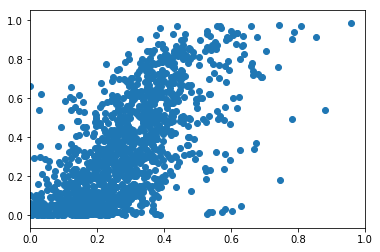

In [176]:
NoiseOther_TimeSeries = NoiseOther_TimeSeries.fillna(0)
NoiseOther_TimeSeries.index = [int(i) for i in NoiseOther_TimeSeries.index]
NoiseResidential_TimeSeries = NoiseResidential_TimeSeries.fillna(0)
NoiseResidential_TimeSeries.index = [int(i) for i in NoiseResidential_TimeSeries.index]
NHCau_TimeSeries = NHCau_TimeSeries.fillna(0)
NHCau_TimeSeries.index = [int(i) for i in NHCau_TimeSeries.index]
His_TimeSeries = His_TimeSeries.fillna(0)
His_TimeSeries.index = [int(i) for i in His_TimeSeries.index]

threshold_gentrify = pd.read_csv('Threshold_2.csv')
threshold_gentrify = threshold_gentrify.loc[threshold_gentrify.geoid.isin(qualified_first_step),:]
threshold_gentrify = threshold_gentrify.loc[threshold_gentrify.geoid.isin(NoiseOther_TimeSeries.index),:]

population_geoid = {}
for i in df.geoid.unique():
    population_geoid[i] = df.loc[df.geoid==i,'Population'].values[0]

    
# for i in range(2014,2019):
#     NoiseOther_TimeSeries.loc[:,'momentum_{}'.format(i)] = np.Nan
#     NoiseResidential_TimeSeries.loc[:,'momentum_{}'.format(i)] = np.Nan
all_result = []
all_tracts = NoiseOther_TimeSeries.index
for tract in tqdm(threshold_gentrify.geoid.unique()):
    for n,year in enumerate( range(2014,2019)):
        tract = int(tract)
        series_noiseother = NoiseOther_TimeSeries.loc[tract,:].iloc[n*12:(n+4)*12] / population_geoid[(tract)]
        series_noiseresid = NoiseResidential_TimeSeries.loc[tract,:].iloc[n*12:(n+4)*12] / population_geoid[tract]
        
        yearly = df.loc[(df.year.isin(range(2009,year+1)))&(df.geoid==tract),:].sort_values('year')
        No_NHCau = yearly.No_NHCau
        No_His = yearly.No_His
        BachelarPerc= yearly.BachelarPerc
        MedianHomeValue = yearly.MedianHomeValue
        MedianIncome = yearly.MedianIncome
        this_tract_result = []
        this_tract_result.append(np.polyfit(np.arange(len(series_noiseother)),series_noiseother,deg=1)[0])
        this_tract_result.append(np.std(series_noiseother))
        this_tract_result.append(np.mean(series_noiseother))
        this_tract_result.append((series_noiseother[-1]-series_noiseother[0])/(series_noiseother[0]+0.00001))
        
        this_tract_result.append(np.polyfit(np.arange(len(series_noiseresid)),series_noiseresid,deg=1)[0])
        this_tract_result.append(np.std(series_noiseresid))
        this_tract_result.append(np.mean(series_noiseresid))
        this_tract_result.append((series_noiseresid[-1]-series_noiseresid[0])/(series_noiseresid[0]+0.00001))
        
        this_tract_result.append(np.polyfit(np.arange(len(No_NHCau)),No_NHCau,deg=1)[0])
        this_tract_result.append(np.std(No_NHCau))
        this_tract_result.append(np.polyfit(np.arange(len(No_His)),No_His,deg=1)[0])
        this_tract_result.append(np.std(No_His))
        this_tract_result.append(np.polyfit(np.arange(len(BachelarPerc)),BachelarPerc,deg=1)[0])
        this_tract_result.append(np.std(BachelarPerc))
        this_tract_result.append(np.polyfit(np.arange(len(MedianHomeValue)),MedianHomeValue,deg=1)[0])
        this_tract_result.append(np.std(MedianHomeValue))
        this_tract_result.append(np.polyfit(np.arange(len(MedianIncome)),MedianIncome,deg=1)[0])
        this_tract_result.append(np.std(MedianIncome))
        
        this_tract_result.append(threshold_gentrify.loc[(threshold_gentrify.year==year) & (threshold_gentrify.geoid==tract),'Threshold'].values[0])
        all_result.append(this_tract_result)
        
import statsmodels.api as sm # import statsmodels 
ols_df_small = pd.DataFrame(all_result,columns=['noiseother momentum','noiseother std','noiseother mean','noiseother begin/end change',
                                 'noiseresid momentum','noiseresid std','noiseresid mean','noiseresid begin/end change',
                                 'No_NHCau momentum','No_NHCau std','No_His momentum','No_His std',
                                 'BachelarPerc momentum','BachelarPerc std','MedianHomeValue momentum','MedianHomeValue std',
                                'MedianIncome Momentum','MedianIncome std','threshold'])

X = ols_df_small.iloc[:,:-1] ## X usually means our input variables (or independent variables)
y = ols_df_small.iloc[:,-1] ## Y usually means our output/dependent variable
X = sm.add_constant(X) ## let's add an intercept (beta_0) to our model

# Note the difference in argument order
model = sm.OLS(y, X).fit() ## sm.OLS(output, input)
predictions = model.predict(X)

# Print out the statistics
dp(model.summary())

X = ols_df_small.iloc[:200,:-1] ## X usually means our input variables (or independent variables)
y = ols_df_small.iloc[:200,-1] ## Y usually means our output/dependent variable
X = sm.add_constant(X) ## let's add an intercept (beta_0) to our model

# Note the difference in argument order
model = sm.OLS(y, X).fit() ## sm.OLS(output, input)


X = ols_df_small.iloc[200:,:-1]
X = sm.add_constant(X) 
predictions = model.predict(X)
plt.scatter(predictions,ols_df_small.iloc[200:,-1])
plt.xlim(0,1)

In [179]:
np.corrcoef((predictions,ols_df_small.iloc[200:,-1]))

array([[1.        , 0.63596193],
       [0.63596193, 1.        ]])

(0, 1)

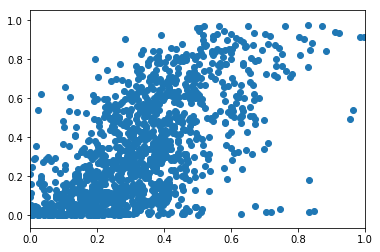

In [178]:
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
import numpy as np

X = ols_df_small.iloc[:200,:-1] ## X usually means our input variables (or independent variables)
y = ols_df_small.iloc[:200,-1] ## Y usually means our output/dependent variable
regr = make_pipeline(StandardScaler(), SVR(kernel='linear',C=0.5, epsilon=0.1))
regr.fit(X, y)

X = ols_df_small.iloc[200:,:-1]
predictions = regr.predict(X)
plt.scatter(predictions,ols_df_small.iloc[200:,-1])
plt.xlim(0,1)

# regression on all tracts

100%|██████████| 1744/1744 [00:43<00:00, 39.85it/s]
C:\Users\richard\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              threshold   R-squared:                       0.388
Model:                            OLS   Adj. R-squared:                  0.387
Method:                 Least Squares   F-statistic:                     306.6
Date:                Sun, 25 Oct 2020   Prob (F-statistic):               0.00
Time:                        14:12:07   Log-Likelihood:                 1619.7
No. Observations:                8720   AIC:                            -3201.
Df Residuals:                    8701   BIC:                            -3067.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                           0.2866      0.007     42.526      0.000       0.273       0.300
noiseother momentum            88.9072    216.230      0.411      0.681    -334.955     512.770
noiseother std                 -9.1495     15.282     -0.599      0.549     -39.106      20.807
noiseother mean                54.6044     11.763      4.642      0.000      31.546      77.662
noiseother begin/end change -1.875e-05   4.43e-05     -0.423      0.672      -0.000    6.81e-05
noiseresid momentum          -307.2743    208.803     -1.472      0.141    -716.578     102.030
noiseresid std                 -6.4892     14.409     -0.450      0.652     -34.735      21.756
noiseresid mean               -15.2687     11.130     -1.372      0.170     -37.086       6.549
noiseresid begin/end change  8.796e-05   4.72e-05      1.865      0.062   -4.51e-06       0.000
No_NHCau momentum               0.0003   3.32e-05      8.415      0.000       0.000       0.000
No_NHCau std                 7.687e-05   1.79e-05      4.285      0.000    4.17e-05       0.000
No_His momentum                 0.0001   3.78e-05      3.802      0.000    6.97e-05       0.000
No_His std                     -0.0001   2.08e-05     -5.136      0.000      -0.000   -6.61e-05
BachelarPerc momentum          19.4320      0.299     65.081      0.000      18.847      20.017
BachelarPerc std               -0.2928      0.213     -1.375      0.169      -0.710       0.125
MedianHomeValue momentum     1.256e-09   2.33e-10      5.382      0.000    7.99e-10    1.71e-09
MedianHomeValue std         -4.979e-10   6.83e-11     -7.293      0.000   -6.32e-10   -3.64e-10
MedianIncome Momentum        7.601e-09   1.36e-09      5.596      0.000    4.94e-09    1.03e-08
MedianIncome std             7.008e-10      4e-10      1.750      0.080   -8.41e-11    1.49e-09
==============================================================================
Omnibus:                        2.817   Durbin-Watson:                   0.740
Prob(Omnibus):                  0.244   Jarque-Bera (JB):                2.850
Skew:                           0.040   Prob(JB):                        0.241
Kurtosis:                       2.961   Cond. No.                     6.04e+12
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.04e+12. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

(0, 1)

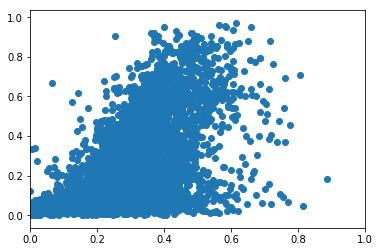

In [163]:
NoiseOther_TimeSeries = NoiseOther_TimeSeries.fillna(0)
NoiseOther_TimeSeries.index = [int(i) for i in NoiseOther_TimeSeries.index]
NoiseResidential_TimeSeries = NoiseResidential_TimeSeries.fillna(0)
NoiseResidential_TimeSeries.index = [int(i) for i in NoiseResidential_TimeSeries.index]
NHCau_TimeSeries = NHCau_TimeSeries.fillna(0)
NHCau_TimeSeries.index = [int(i) for i in NHCau_TimeSeries.index]
His_TimeSeries = His_TimeSeries.fillna(0)
His_TimeSeries.index = [int(i) for i in His_TimeSeries.index]

threshold_gentrify = pd.read_csv('Threshold_2.csv')
#threshold_gentrify = threshold_gentrify.loc[threshold_gentrify.geoid.isin(qualified_first_step),:]
threshold_gentrify = threshold_gentrify.loc[threshold_gentrify.geoid.isin(NoiseOther_TimeSeries.index),:]

population_geoid = {}
for i in df.geoid.unique():
    population_geoid[i] = df.loc[df.geoid==i,'Population'].values[0]

    
# for i in range(2014,2019):
#     NoiseOther_TimeSeries.loc[:,'momentum_{}'.format(i)] = np.Nan
#     NoiseResidential_TimeSeries.loc[:,'momentum_{}'.format(i)] = np.Nan
all_result = []
output_time_series = []
all_tracts = NoiseOther_TimeSeries.index
for tract in tqdm(threshold_gentrify.geoid.unique()):
    for n,year in enumerate( range(2014,2019)):
        tract = int(tract)
        series_noiseother = NoiseOther_TimeSeries.loc[tract,:].iloc[n*12:(n+4)*12] / population_geoid[(tract)]
        series_noiseresid = NoiseResidential_TimeSeries.loc[tract,:].iloc[n*12:(n+4)*12] / population_geoid[tract]
        
        
        yearly = df.loc[(df.year.isin(range(2009,year+1)))&(df.geoid==tract),:].sort_values('year')
        No_NHCau = yearly.No_NHCau
        No_His = yearly.No_His
        BachelarPerc= yearly.BachelarPerc
        MedianHomeValue = yearly.MedianHomeValue
        MedianIncome = yearly.MedianIncome
        this_tract_result = []
        this_tract_result.append(np.polyfit(np.arange(len(series_noiseother)),series_noiseother,deg=1)[0])
        this_tract_result.append(np.std(series_noiseother))
        this_tract_result.append(np.mean(series_noiseother))
        this_tract_result.append((series_noiseother[-1]-series_noiseother[0])/(series_noiseother[0]+0.00001))
        
        this_tract_result.append(np.polyfit(np.arange(len(series_noiseresid)),series_noiseresid,deg=1)[0])
        this_tract_result.append(np.std(series_noiseresid))
        this_tract_result.append(np.mean(series_noiseresid))
        this_tract_result.append((series_noiseresid[-1]-series_noiseresid[0])/(series_noiseresid[0]+0.00001))
        
        this_tract_result.append(np.polyfit(np.arange(len(No_NHCau)),No_NHCau,deg=1)[0])
        this_tract_result.append(np.std(No_NHCau))
        this_tract_result.append(np.polyfit(np.arange(len(No_His)),No_His,deg=1)[0])
        this_tract_result.append(np.std(No_His))
        this_tract_result.append(np.polyfit(np.arange(len(BachelarPerc)),BachelarPerc,deg=1)[0])
        this_tract_result.append(np.std(BachelarPerc))
        this_tract_result.append(np.polyfit(np.arange(len(MedianHomeValue)),MedianHomeValue,deg=1)[0])
        this_tract_result.append(np.std(MedianHomeValue))
        this_tract_result.append(np.polyfit(np.arange(len(MedianIncome)),MedianIncome,deg=1)[0])
        this_tract_result.append(np.std(MedianIncome))
        
        this_tract_result.append(threshold_gentrify.loc[(threshold_gentrify.year==year) & (threshold_gentrify.geoid==tract),'Threshold'].values[0])
        all_result.append(this_tract_result)
        
import statsmodels.api as sm # import statsmodels 
ols_df = pd.DataFrame(all_result,columns=['noiseother momentum','noiseother std','noiseother mean','noiseother begin/end change',
                                 'noiseresid momentum','noiseresid std','noiseresid mean','noiseresid begin/end change',
                                 'No_NHCau momentum','No_NHCau std','No_His momentum','No_His std',
                                 'BachelarPerc momentum','BachelarPerc std','MedianHomeValue momentum','MedianHomeValue std',
                                'MedianIncome Momentum','MedianIncome std','threshold'])
X = ols_df.iloc[:,:-1] ## X usually means our input variables (or independent variables)
y = ols_df.iloc[:,-1] ## Y usually means our output/dependent variable
X = sm.add_constant(X) ## let's add an intercept (beta_0) to our model

# Note the difference in argument order
model = sm.OLS(y, X).fit() ## sm.OLS(output, input)
predictions = model.predict(X)

# Print out the statistics
dp(model.summary())


X = ols_df.iloc[:5000,:-1] ## X usually means our input variables (or independent variables)
y = ols_df.iloc[:5000,-1] ## Y usually means our output/dependent variable
X = sm.add_constant(X) ## let's add an intercept (beta_0) to our model

# Note the difference in argument order
model = sm.OLS(y, X).fit() ## sm.OLS(output, input)


X = ols_df.iloc[5000:,:-1]
X = sm.add_constant(X) 
predictions = model.predict(X)
plt.scatter(predictions,ols_df.iloc[5000:,-1])
plt.xlim(0,1)

In [164]:
ols_df

,noiseother momentum,noiseother std,noiseother mean,noiseother begin/end change,noiseresid momentum,noiseresid std,noiseresid mean,noiseresid begin/end change,No_NHCau momentum,No_NHCau std,No_His momentum,No_His std,BachelarPerc momentum,BachelarPerc std,MedianHomeValue momentum,MedianHomeValue std,MedianIncome Momentum,MedianIncome std,threshold
0,0.000000e+00,0.000000,0.000000,0.000000,4.034251e-07,0.000029,0.000004,0.000000,-6.171429,23.930455,67.742857,168.557030,0.001788,0.011952,-16722.857143,34910.588174,-734.942857,2207.499673,0.104202
1,0.000000e+00,0.000000,0.000000,0.000000,1.417440e-07,0.000029,0.000004,0.000000,-2.250000,22.768578,22.428571,169.060187,0.000576,0.011206,-15964.285714,36996.988294,-723.000000,2217.750773,0.050896
2,0.000000e+00,0.000000,0.000000,0.000000,-1.199372e-07,0.000029,0.000004,0.000000,-2.511905,21.673356,15.261905,158.146095,-0.001102,0.012028,-12717.857143,35573.776771,30.809524,2906.105728,0.092152
3,8.940772e-07,0.000057,0.000008,0.000000,-3.816183e-07,0.000029,0.000004,0.000000,-4.933333,25.328947,12.766667,149.424658,-0.001900,0.012525,-9461.666667,33642.701408,620.133333,3933.051048,0.124129
4,8.395603e-07,0.000064,0.000013,0.000000,4.470386e-07,0.000029,0.000004,0.000000,2.448485,40.983411,7.800000,141.991725,-0.002102,0.012526,-7838.787879,32347.890194,857.309091,4349.222528,0.079446
5,5.737788e-07,0.000032,0.000005,22.492128,0.000000e+00,0.000000,0.000000,0.000000,-23.028571,48.835324,159.257143,322.749645,-0.001834,0.006725,-16234.285714,30083.882728,-1270.028571,2966.016375,0.073468
6,2.807854e-07,0.000032,0.000005,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-19.607143,48.313601,104.464286,299.241354,-0.001756,0.006537,-15750.000000,33326.896657,-1569.285714,3735.737427,0.055697
7,-1.220806e-08,0.000032,0.000005,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-21.380952,55.945844,72.761905,280.188218,-0.002214,0.007384,-14227.380952,34506.047930,-1532.202381,3991.432902,0.046668
8,-3.052015e-07,0.000032,0.000005,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-26.316667,75.132476,63.916667,271.161471,-0.002102,0.007432,-12828.333333,35232.185762,-1394.216667,4057.191886,0.038030
9,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-17.793939,71.660031,46.000000,257.260180,-0.001671,0.007094,-11078.181818,34780.116446,-1132.884848,3904.156938,0.044572


(0, 1)

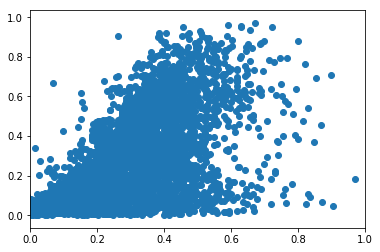

In [175]:
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
import numpy as np

X = ols_df.iloc[:5000,:-1] ## X usually means our input variables (or independent variables)
y = ols_df.iloc[:5000,-1] ## Y usually means our output/dependent variable
regr = make_pipeline(StandardScaler(), SVR(kernel='linear',C=0.5, epsilon=0.1))
regr.fit(X, y)

X = ols_df.iloc[5000:,:-1]
predictions = regr.predict(X)
plt.scatter(predictions,ols_df.iloc[5000:,-1])
plt.xlim(0,1)